In [1]:
import pandas as pd
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm, linregress, skew
from Data_scrapping import get_market_data_about_option_chain_for_computing_implied_volatility, get_data_about_crypto_options, get_funding_rate
from Computing_IV import get_Implied_volatility, black_delta_formula
from Graphs import plot_discount_curve, lines_3D, lines_3D_SVI_raw, lines_2D_SVI_raw, lines_3D_data_options, error_graph_3D, lines_2D_SVI, lines_2D_total_varience
from SVI_curves import computing_SVI_IV
from check_static_arbitrage import get_g_function_for_butterfly_arbitrage, check_butterflies_arbitrage_with_formula, check_calendar_arbitrage, check_limit_price, check_static_arbitrage, get_graph_for_check_arbitrage_for_different_maturities
from Computing_option_prices import get_data_about_option
from Functions_for_extrapolation import get_jump_wing_param, get_curvature, get_skew, get_SVI_extrapolation, lines_2D_SVI_example, get_grids_for_volatility_surface, lines_2D_SVI_for_interpolate, get_w_SVI_raw
from SVI_calibrator import SVI
from mpl_toolkits.mplot3d import Axes3D

In [2]:
ticker = 'AAPL'
data_date = "2023-06-08_23-59"
filename_for_option_chain = "DATA\\Option_chain\\" + data_date + "\\" + ticker + ".csv"
filename_for_discount_curve = "DATA\\Discount_curve\\" + data_date + "\\Forward_SOFR_curve.xlsx"
options_data = pd.read_csv(filename_for_option_chain)
options_data = options_data.loc[pd.to_datetime(options_data['lastTradeDate']) > '2023-06-08 00:00:00'] # keep trades only in last date
discount_curve = pd.read_excel(filename_for_discount_curve)

In [3]:
Implied_Volatility = get_Implied_volatility(options_data, discount_curve)
Implied_Volatility_without_extrapolation = computing_SVI_IV(Implied_Volatility, ticker, low_limit = 0.1, high_limit = 2.5, N = 1000, extrapolation=False)

In [4]:
w, v, psi, p, c, v_tilda = get_jump_wing_param(Implied_Volatility_without_extrapolation)
curvature_put, curvature_call = get_curvature(Implied_Volatility_without_extrapolation)
vol_min, vol, skew_without_div, skew_with_div = get_skew(Implied_Volatility_without_extrapolation)
expiry_date_list= np.delete(options_data["expiryDate"].unique(), 0).astype('datetime64')
expiry_date_list= np.delete(expiry_date_list, 0).astype('datetime64')
expiry_date_list= options_data["expiryDate"].unique().astype('datetime64')

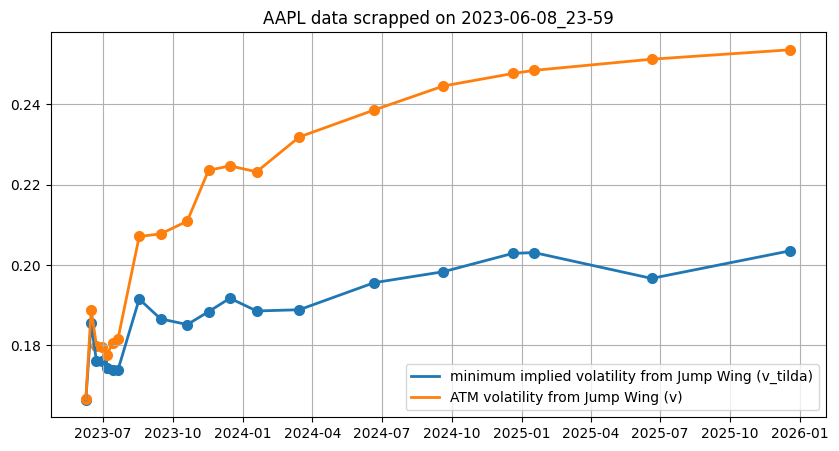

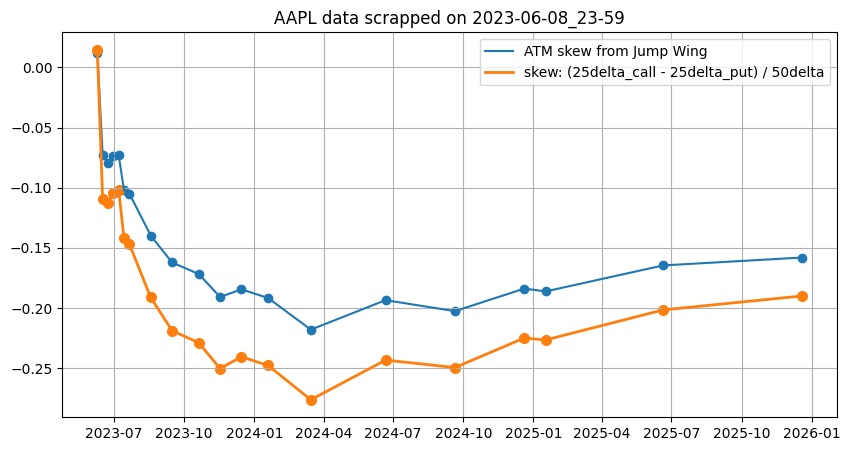

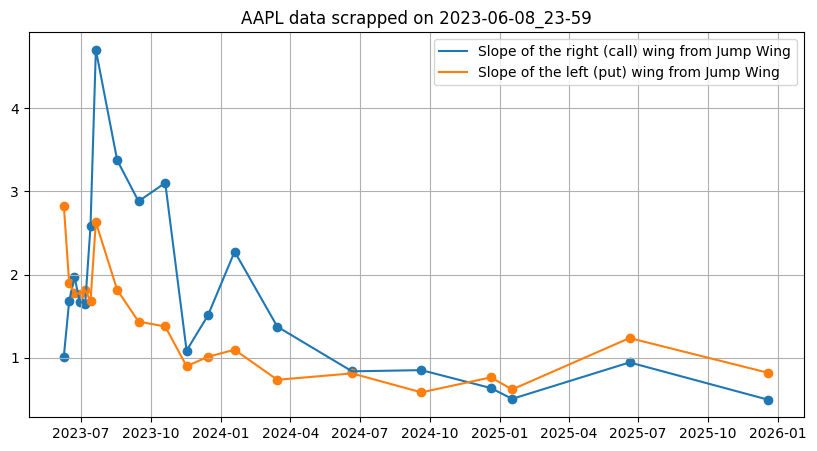

In [5]:
plt.figure(figsize = (10,5))
plt.plot(expiry_date_list, np.sqrt(v_tilda), label = 'minimum implied volatility from Jump Wing (v_tilda)', linewidth=2)
plt.plot(expiry_date_list, np.sqrt(v), label = 'ATM volatility from Jump Wing (v)', linewidth=2)
plt.scatter(expiry_date_list, np.sqrt(v_tilda), linewidth=2)
plt.scatter(expiry_date_list, np.sqrt(v), linewidth=2)
plt.title(ticker + ' data scrapped on ' + data_date)
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize = (10,5))
plt.plot(expiry_date_list, psi, label = 'ATM skew from Jump Wing')
plt.scatter(expiry_date_list, psi)
plt.plot(expiry_date_list, skew_with_div, label = 'skew: (25delta_call - 25delta_put) / 50delta', linewidth=2)
plt.scatter(expiry_date_list, skew_with_div, linewidth=2)
plt.title(ticker + ' data scrapped on ' + data_date)
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize = (10,5))
plt.plot(expiry_date_list, c, label = 'Slope of the right (call) wing from Jump Wing' )
plt.plot(expiry_date_list, p, label = 'Slope of the left (put) wing from Jump Wing')
plt.scatter(expiry_date_list, c)
plt.scatter(expiry_date_list, p)
plt.title(ticker + ' data scrapped on ' + data_date)
plt.legend()
plt.grid()
plt.show()

## Adjustment based on a correction of Durrleman's function

The condition for the absence of butterfly arbitrage is
$$
g(x) := \left(1-\frac{xw'(x)}{2w(x)}\right)^2 - \frac14 (w'(x))^2 \left(\frac1{w(x)}+\frac14\right) + \frac12 w''(x) \ge 0
$$
($x$ is the log-moneyness, $w(x)$ is the total variance). 

Let $g(x)$ be the corresponding function of an SVI curve. We correct the curve and construct $\tilde w(x)$ by solving
$$
\left\{
\begin{aligned}
&\frac12 \tilde w''(x) = g(x)^+ - \left(1-\frac{x\tilde w'(x)}{2\tilde w(x)}\right)^2 + \frac14 (\tilde w'(x))^2 \left(\frac1{\tilde w(x)}+\frac14\right),\\
&\tilde w(x_0) = w(x_0),\\
&\tilde w'(x_0) = w'(x_0),
\end{aligned}
\right.
$$
where $x_0$ is the left point of the curve.

By construction, Durrleman's function of $\tilde w(x)$ is equal to $\tilde g(x) = g(x)^+\ge 0$, hence the new curve is free of butterfly arbitrage.

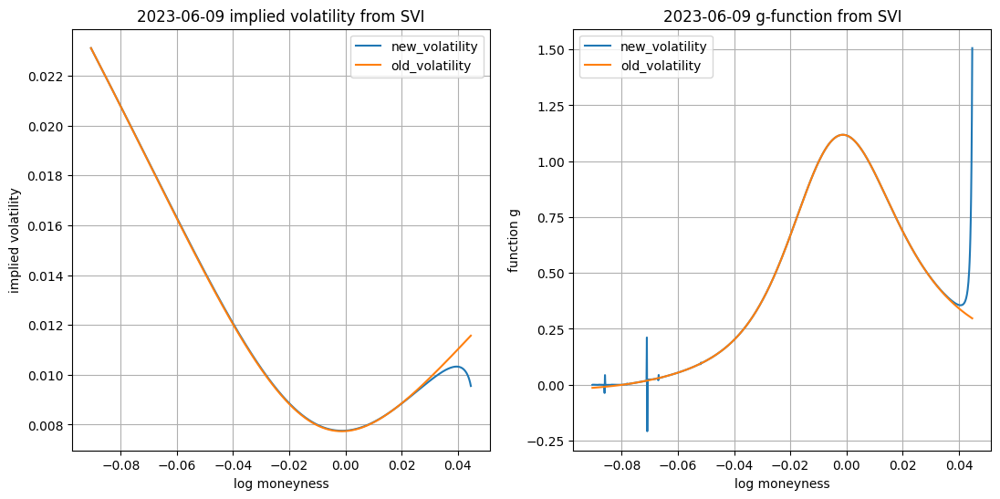

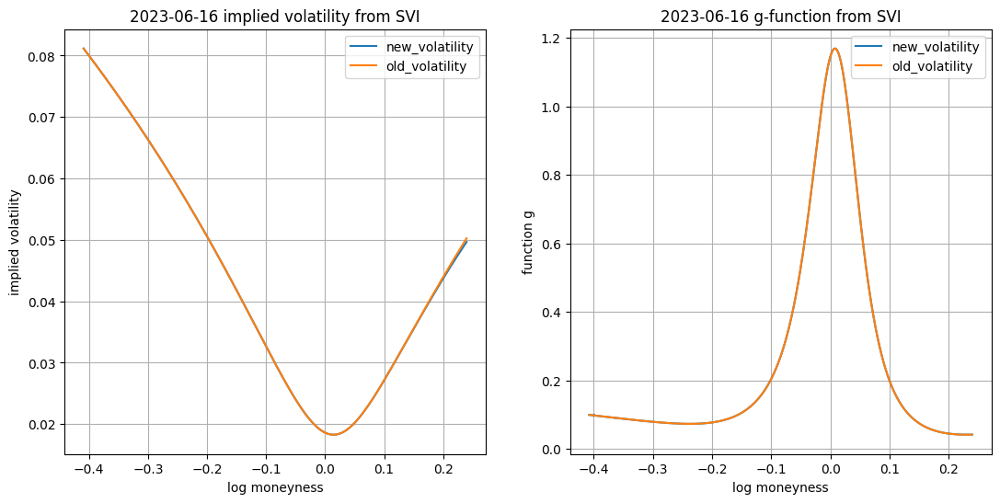

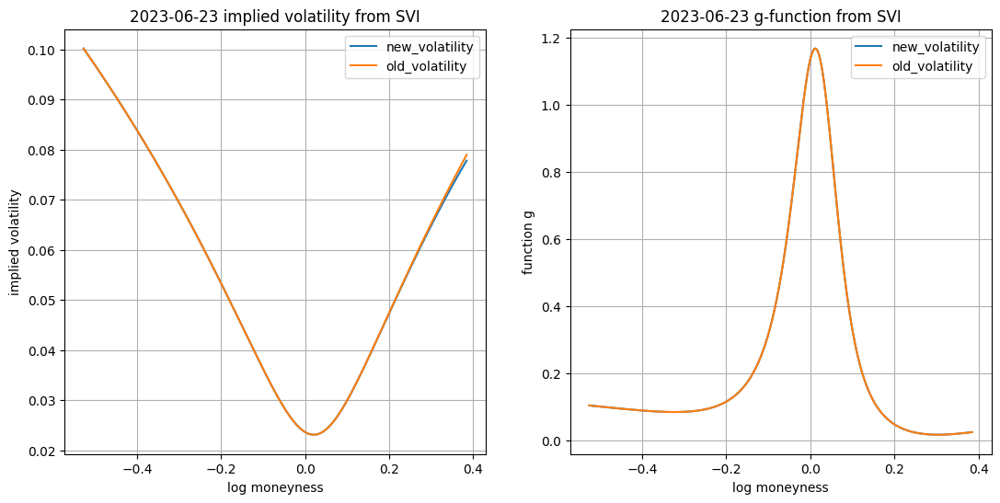

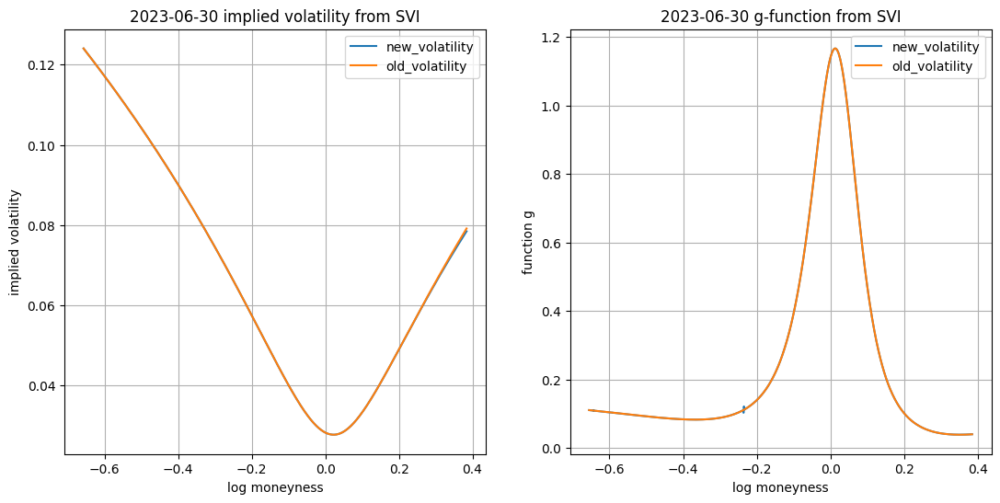

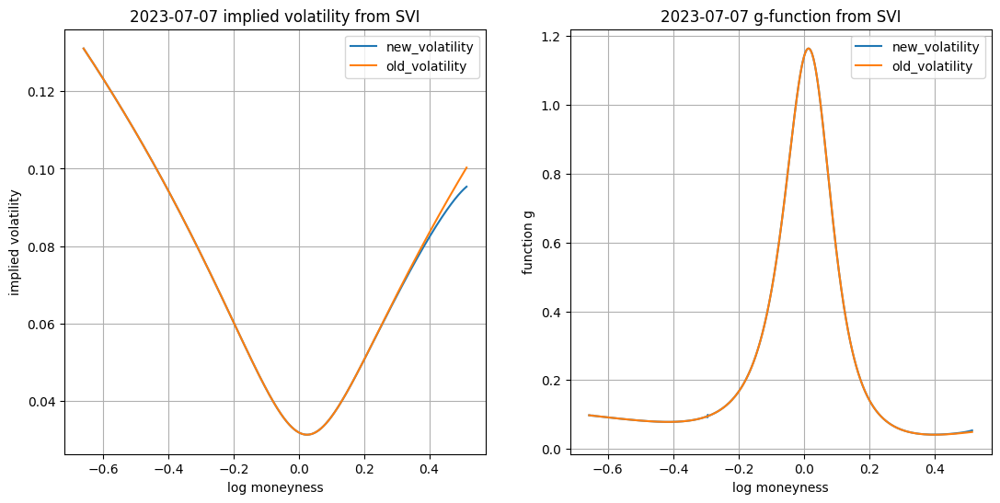

...

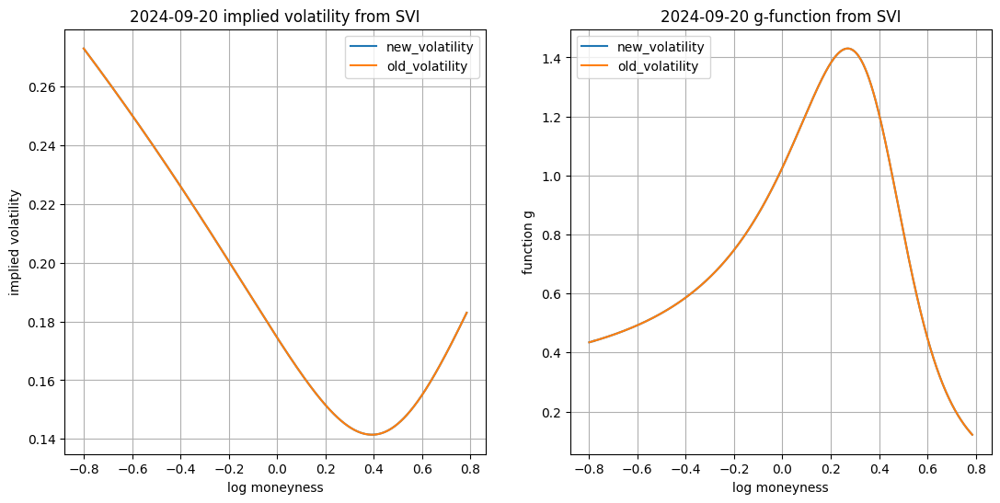

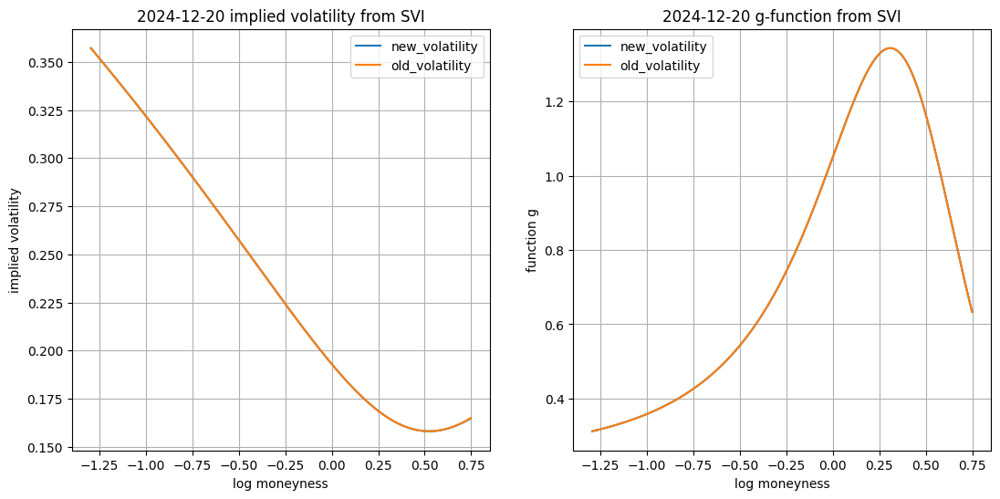

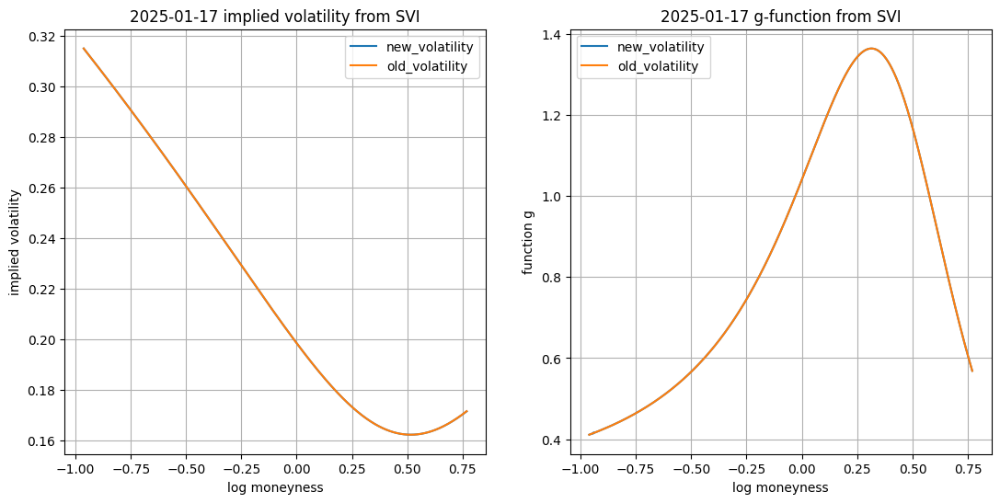

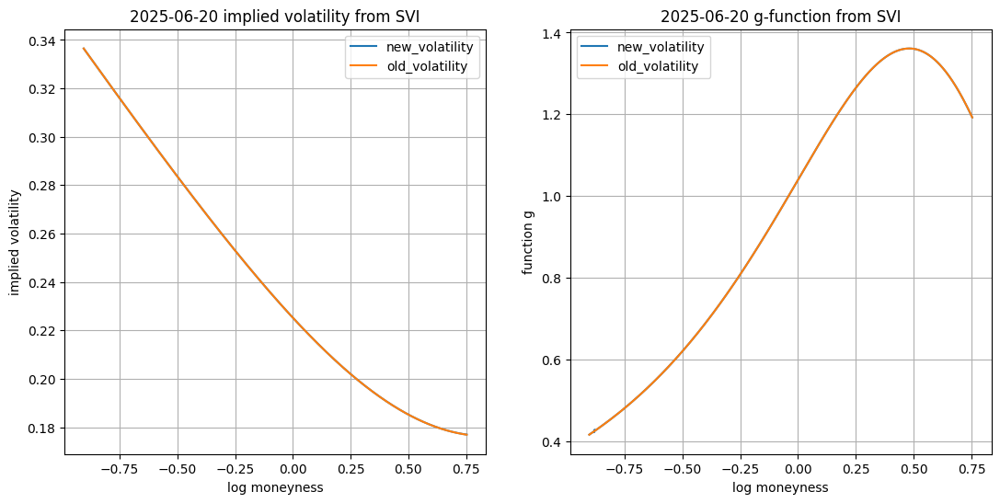

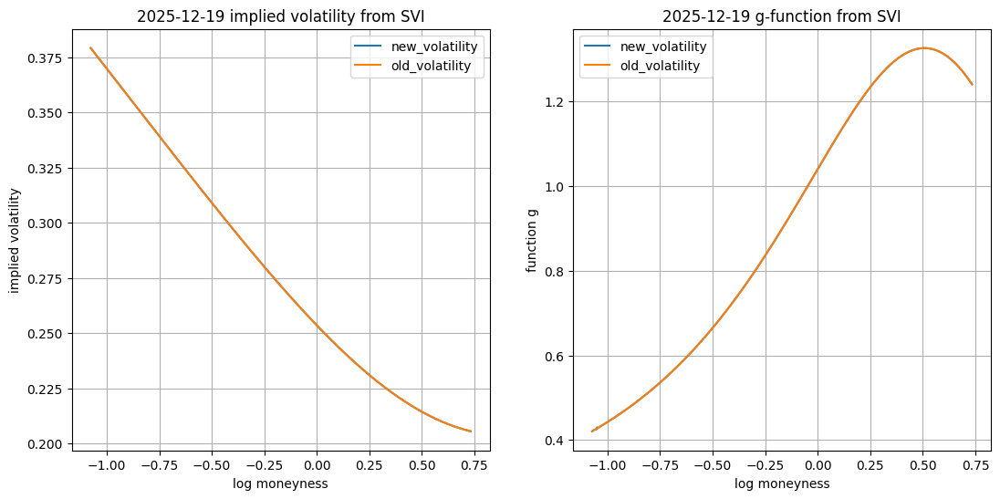

In [6]:
for timents in range(0,len(Implied_Volatility_without_extrapolation['implied_volatility_surface'])):
    if timents == 0:
        coef = 1.2
    else:
        coef = 1.6
    set_param_raw = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['set_param_raw']
    X_first = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['strikes'][0] / Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['reference_forward']
    X_last = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['strikes'][-1] / Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['reference_forward']
    X = np.linspace(np.log(X_first) * coef, np.log(X_last) * coef, 1000)
    expiry_date = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['expiry_date']
    t = Implied_Volatility_without_extrapolation['implied_volatility_surface'][-1]['expiry_date_in_act365_year_fraction']
    get_g_function_for_butterfly_arbitrage(X, set_param_raw, expiry_date, coef, t, graph=True, N=1000)

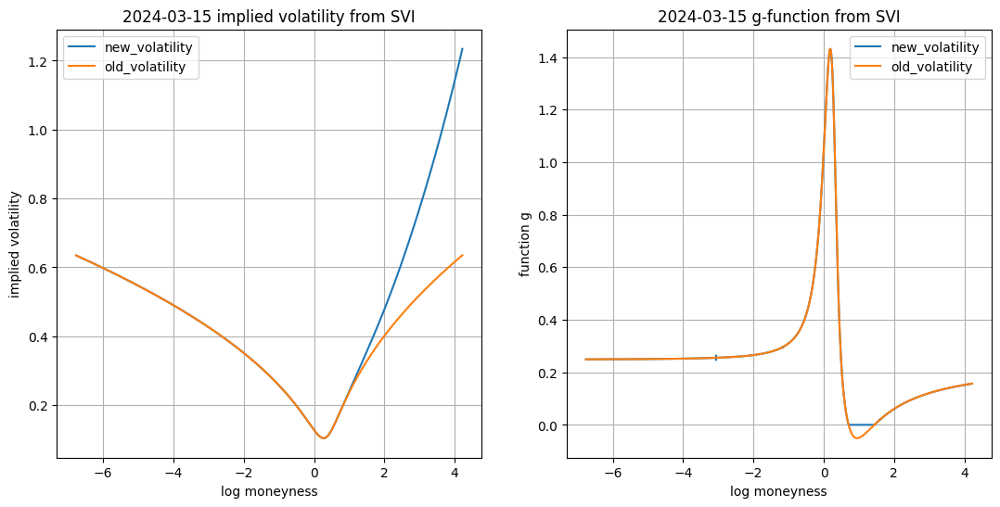

In [7]:
coef = 10
timents = 13
set_param_raw = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['set_param_raw']
X_first = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['strikes'][0] / Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['reference_forward']
X_last = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['strikes'][-1] / Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['reference_forward']
X = np.linspace(np.log(X_first) * coef, np.log(X_last) * coef, 10000)
expiry_date = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['expiry_date']
t = Implied_Volatility_without_extrapolation['implied_volatility_surface'][-1]['expiry_date_in_act365_year_fraction']
w_old, w_new = get_g_function_for_butterfly_arbitrage(X, set_param_raw, expiry_date, coef, t, graph=True, N=1000)

In [8]:
set_param_raw_1 = set_param_raw.calibrate(X,w_new)

In [9]:
set_param_raw

SVI(a=-0.05085312332861144, b=0.21463374264994137, rho=0.30356402588724146, m=0.39488008871668223, sigma=0.38339047794332815)

In [10]:
set_param_raw_1

SVI(a=-1.047366275369835, b=1.381604071689442, rho=0.8522992735017462, m=2.7258773803020953, sigma=1.599988462295749)

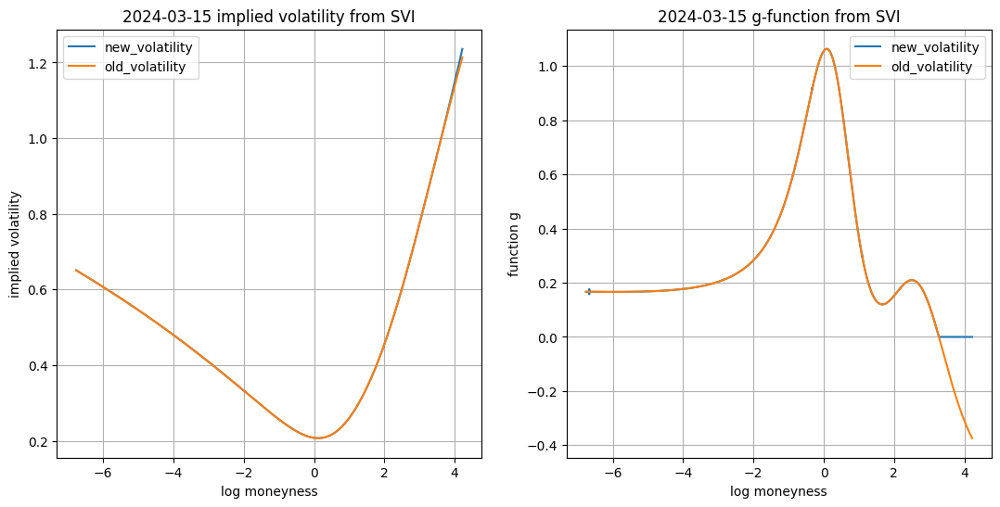

In [11]:
w_old, _ = get_g_function_for_butterfly_arbitrage(X, set_param_raw_1, expiry_date, coef, t, graph=True, N=1000)

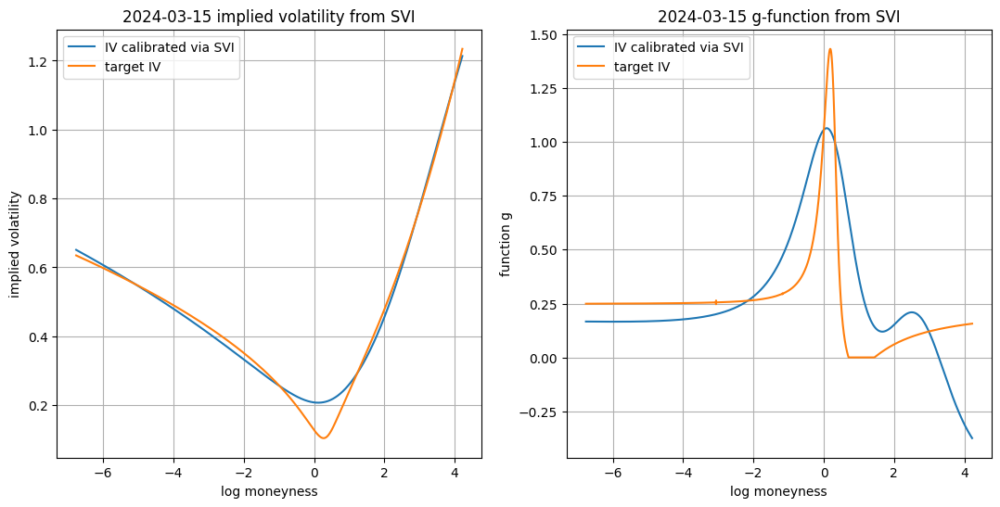

In [12]:
fig = plt.figure(figsize=(13, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

ax1.plot(X,np.sqrt(np.array(w_old) / t), label='IV calibrated via SVI')
ax1.plot(X,np.sqrt(np.array(w_new) / t), label='target IV')
ax1.set_title(expiry_date + ' implied volatility from SVI')
ax1.set_xlabel(r'log moneyness')
ax1.set_ylabel(r'implied volatility')
ax1.grid()
ax1.legend()

def compute_g(X, W):
    wp = np.diff(W)/np.diff(X)
    wpp = np.diff(wp)/np.diff(X[1:])
    w = W[2:]
    wp = wp[1:]
    x = X[2:]
    return x, (1-0.5*x*wp/w)**2 - 0.25*(wp)**2*(1/w+0.25) + 0.5*wpp

ax2.plot(*compute_g(X, np.array(w_old)), label='IV calibrated via SVI')
ax2.plot(*compute_g(X, np.array(w_new)), label='target IV')
ax2.set_title(expiry_date + ' g-function from SVI')
ax2.set_xlabel(r'log moneyness')
ax2.set_ylabel(r'function g')
ax2.grid()
ax2.legend()

plt.show()

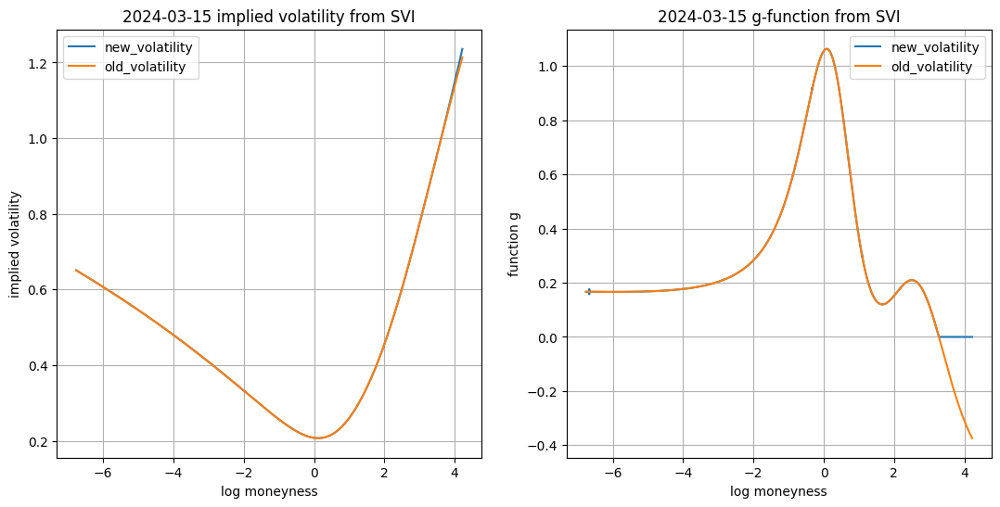

In [13]:
_, w_new = get_g_function_for_butterfly_arbitrage(X, set_param_raw_1, expiry_date, coef, t, graph=True, N=1000)

In [14]:
self = set_param_raw_1
print('w =', self.a + self.b*(-self.rho*self.m + np.sqrt(self.m**2+self.sigma**2)))
w1 = self.a + self.b*(-self.rho*self.m + np.sqrt(self.m**2+self.sigma**2))
print('v =', w1/t)
print('psi =', self.b/np.sqrt(w1)/2 * (-self.m/np.sqrt(self.m**2+self.sigma**2) + self.rho))
print('p =', self.b*(1-self.rho)/np.sqrt(w1))
print('c =', self.b*(1+self.rho)/np.sqrt(w1))
print('v_tilda =', (self.a + self.b*self.sigma*np.sqrt(1-self.rho**2)) / t)

w = 0.10971530304067678
v = 0.0432463127536145
psi = -0.021093574561497467
p = 0.616073647741918
c = 7.726114807901209
v_tilda = 0.04291391708963773


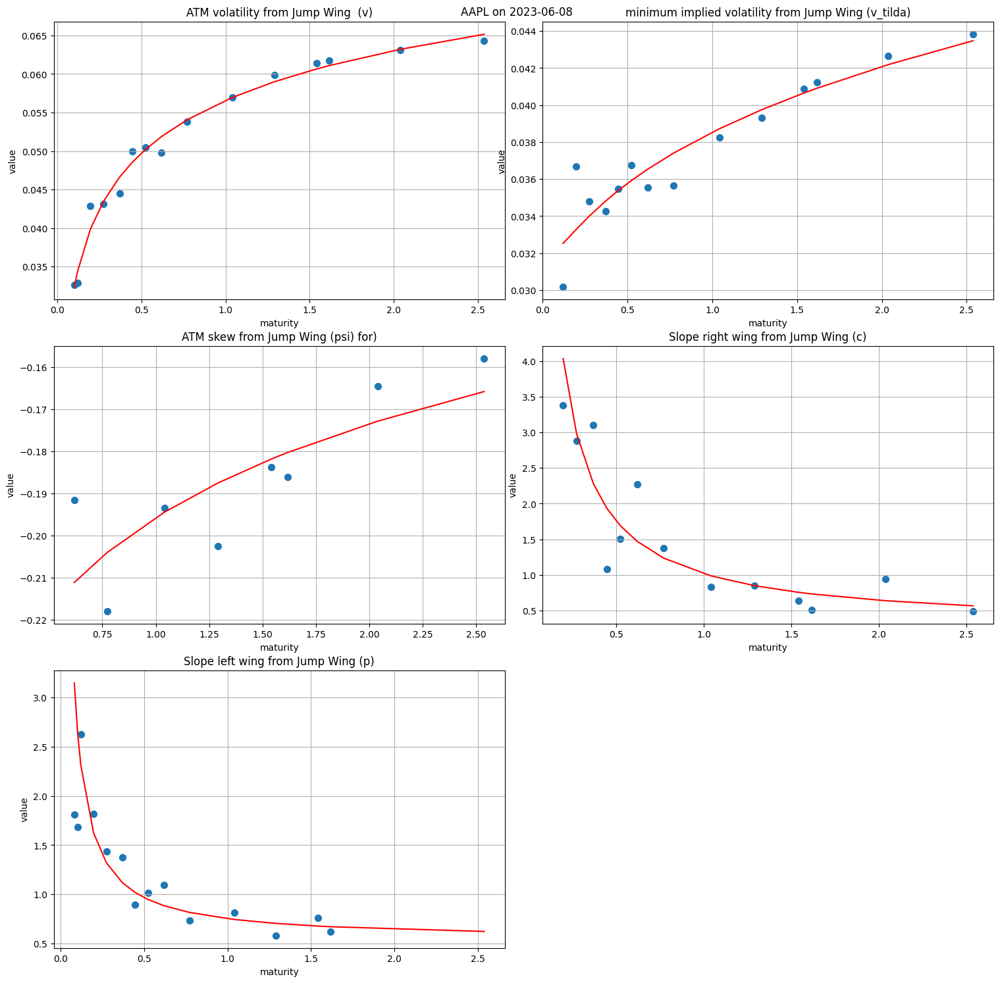

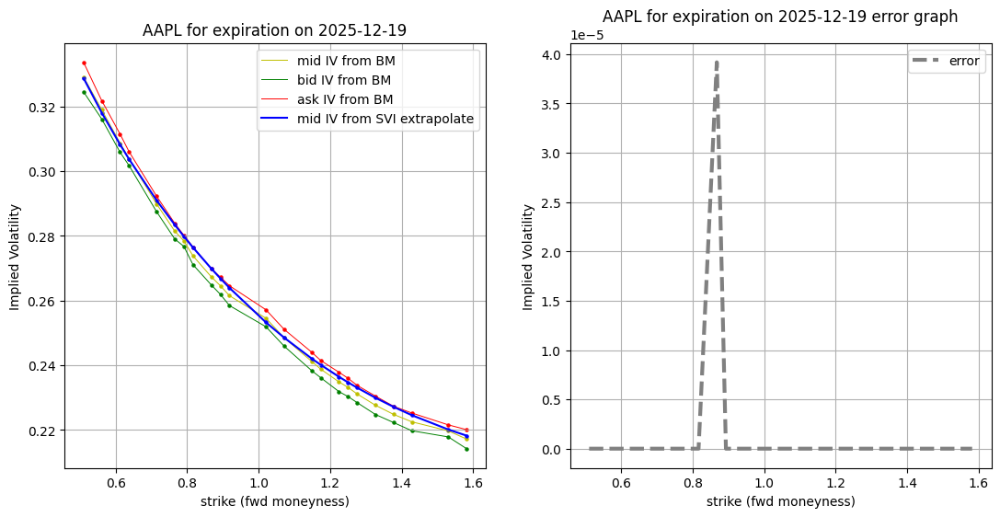

In [15]:
start_v = 5
start_v_tilda = 6
end_psi = 8
start_c = 7
start_p = 4
timeteable = 19
expire_time = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timeteable]['expiry_date_in_act365_year_fraction']
_,_,_,_,_,w_volatility = get_SVI_extrapolation(Implied_Volatility_without_extrapolation, expire_time, start_v, start_v_tilda, end_psi, start_c, start_p,0, 0, type_reggresion = 'polynomial', plot_graph=True)
lines_2D_SVI_example(ticker, Implied_Volatility_without_extrapolation, timeteable, w_volatility)

In [16]:
ranger = range(27,50)
lister_time = [0.7, 0.9, 1.1, 1.2, 1.4, 1.7,1.8,1.9,2.1,2.2,2.3,2.4,2.6] + list(np.array(ranger) / 10)
lister = [13,15,17,18,20,23,24,25,27,28,29,30,32] + list(range(33, 33 + len(ranger)))
t_grid, x_grid, volatility_grid = get_grids_for_volatility_surface(Implied_Volatility_without_extrapolation, lister_time, lister)

In [17]:
t_grid_1 = []
x_grid_1 = []
volatility_grid_1 = []
for i in lister:
    t_grid_1.append(t_grid[i])
    x_grid_1.append(x_grid[i])
    volatility_grid_1.append(volatility_grid[i])

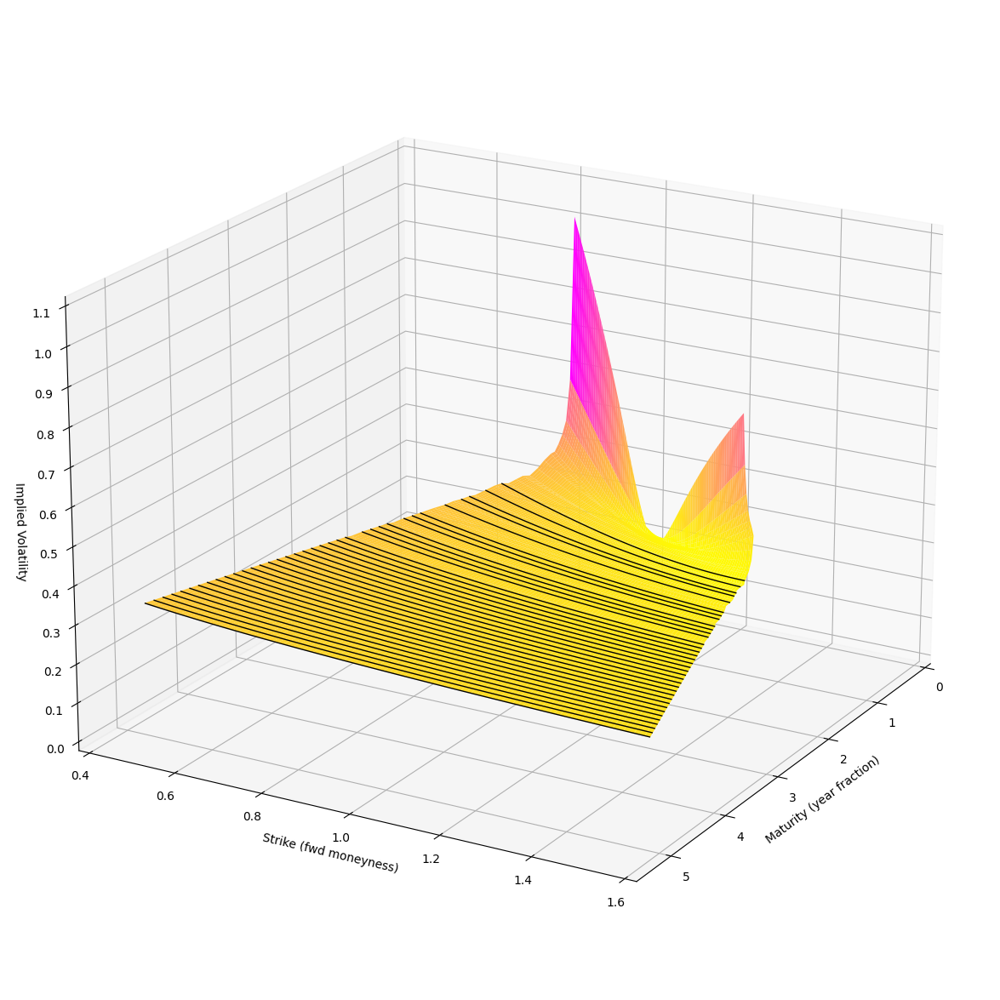

In [18]:
fig = plt.figure(figsize=(40, 15))
ax_3d = fig.add_subplot(projection='3d')
ax_3d.plot_surface(t_grid, np.array(x_grid), np.array(volatility_grid), rstride=1, cstride=1, cmap='spring_r')
ax_3d.plot_wireframe(t_grid_1, np.array(x_grid_1), np.array(volatility_grid_1), rstride=1, cstride=0, linewidth=1, edgecolors='k')
# ax_3d.contourf(t_grid, np.array(x_grid), np.array(volatility_grid), rstride=1, cstride=1, cmap='cool')
# ax_3d.set_title(ticker)
ax_3d.set_xlabel(r'Maturity (year fraction)')
ax_3d.axes.set_xlim3d(left=0, right=5.5)
ax_3d.set_ylabel(r'Strike (fwd moneyness)')
ax_3d.axes.set_ylim3d(bottom=0.4, top=1.6)
ax_3d.set_zlabel(r'Implied Volatility')
ax_3d.axes.set_zlim3d(bottom=0.0, top=1.1) 
ax_3d.set_zticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1])
ax_3d.grid()
ax_3d.view_init(20, 30)

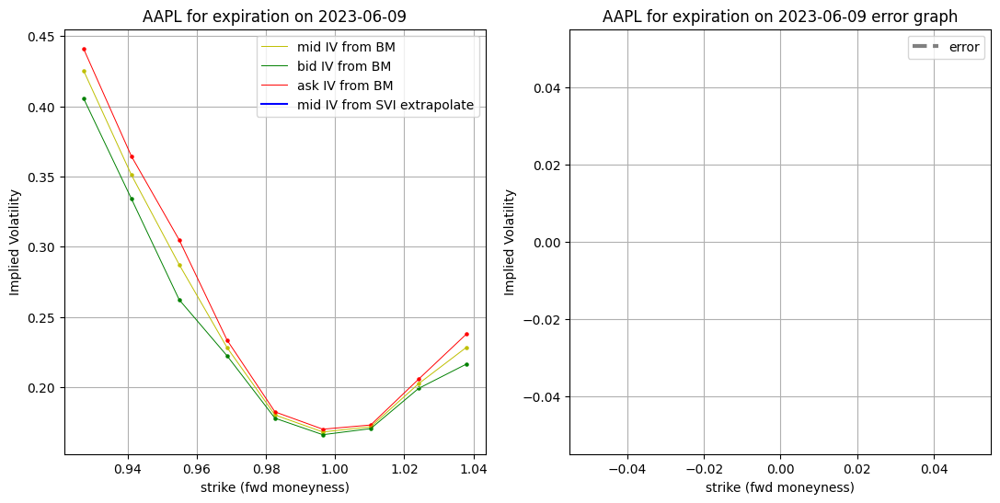

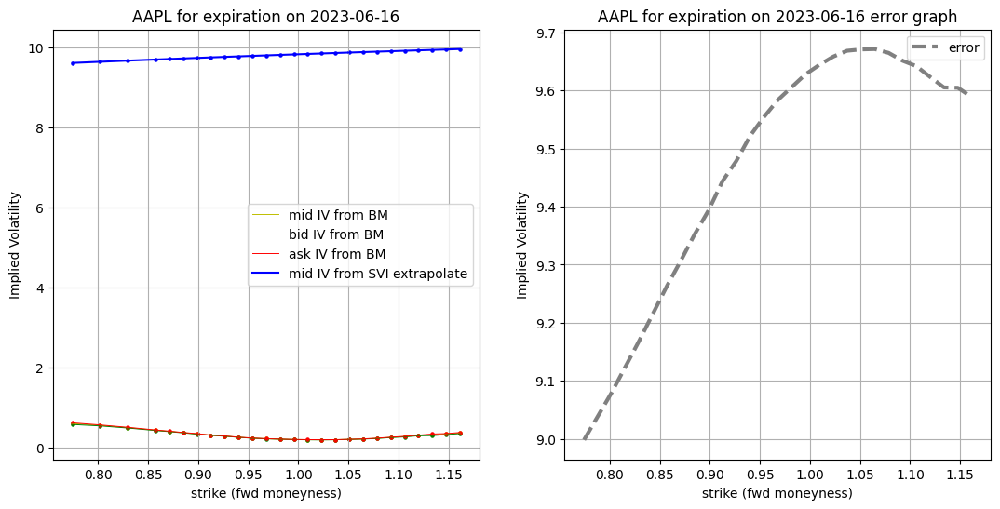

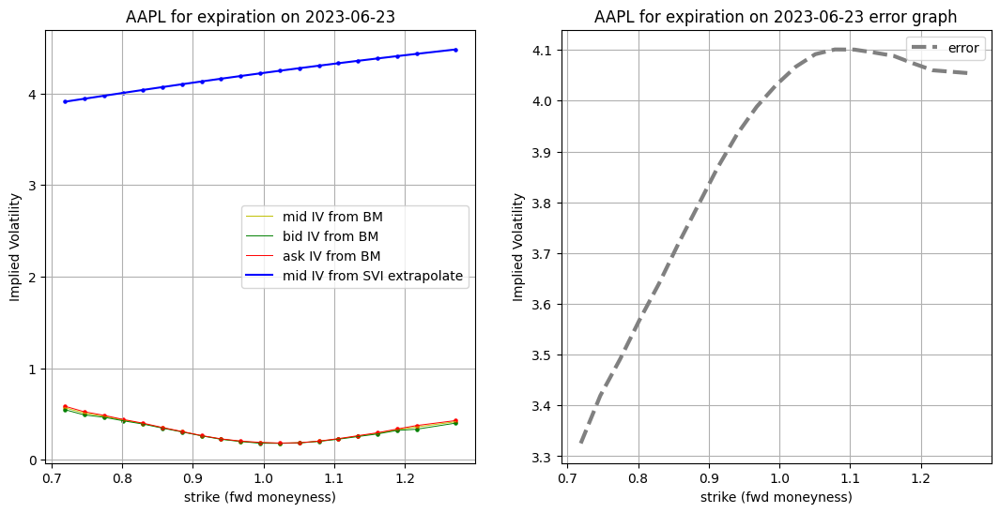

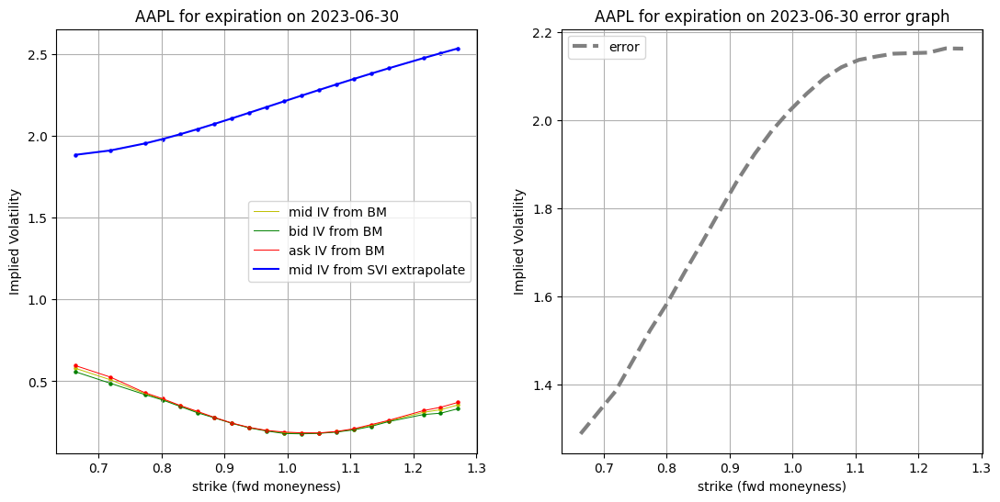

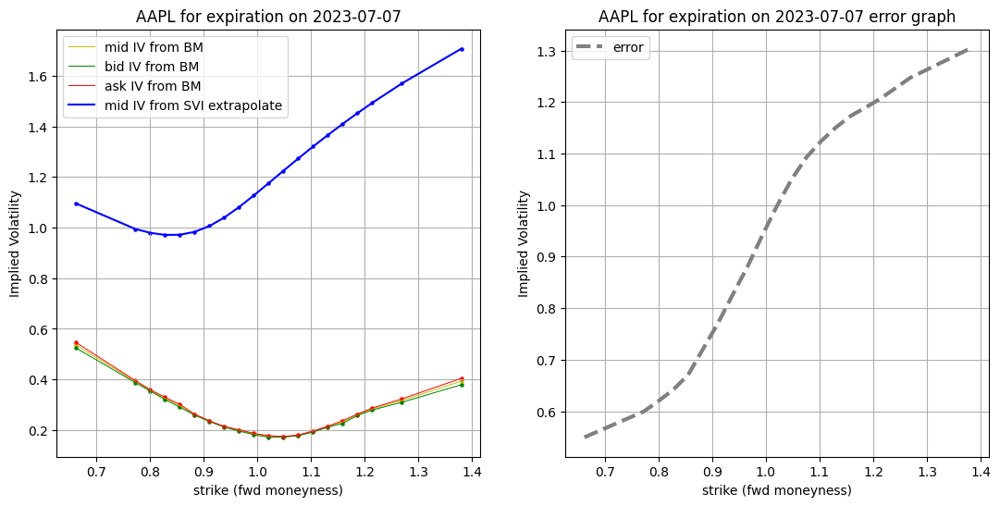

...

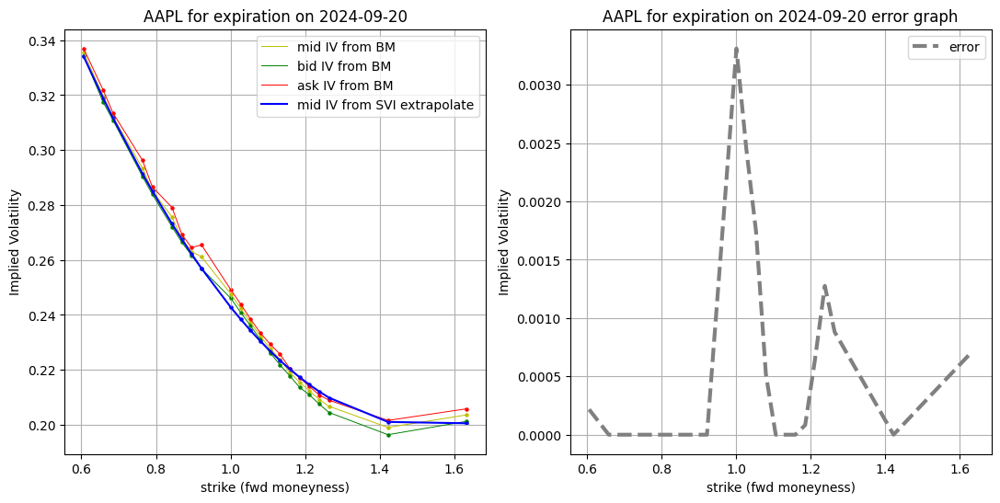

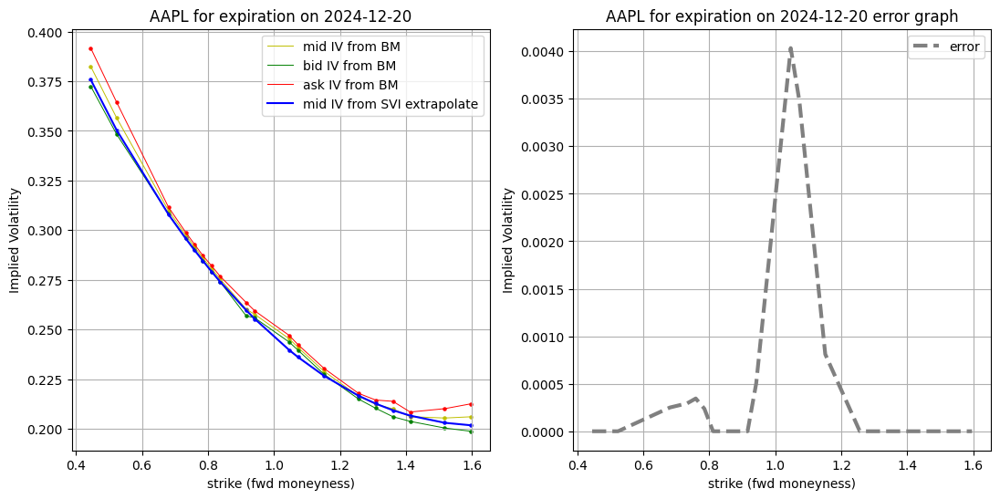

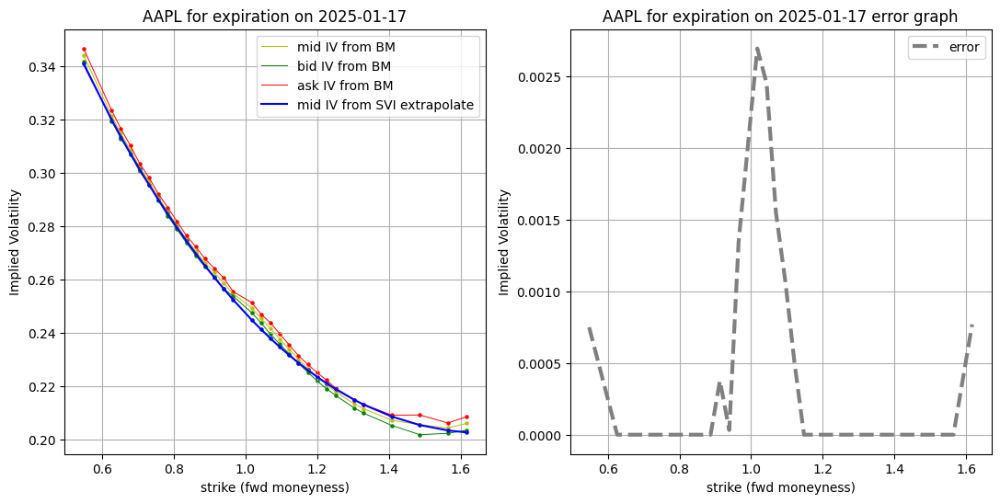

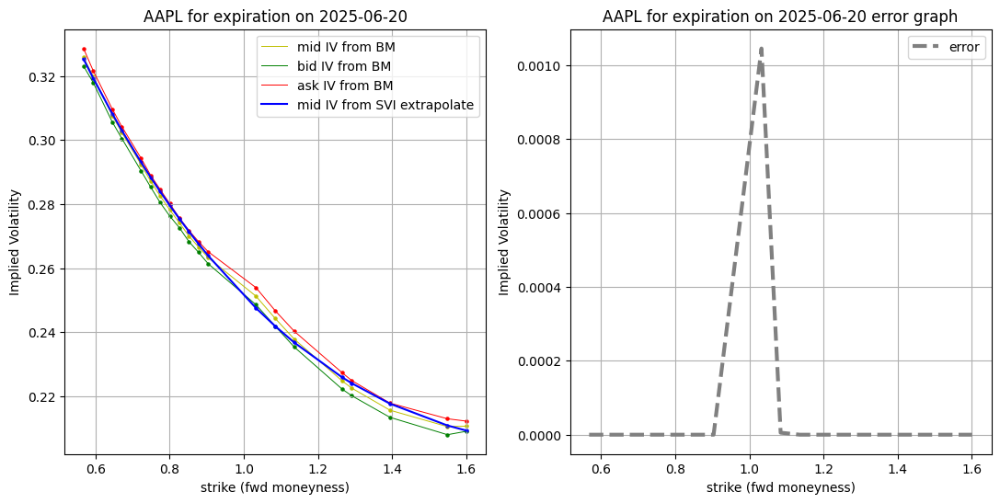

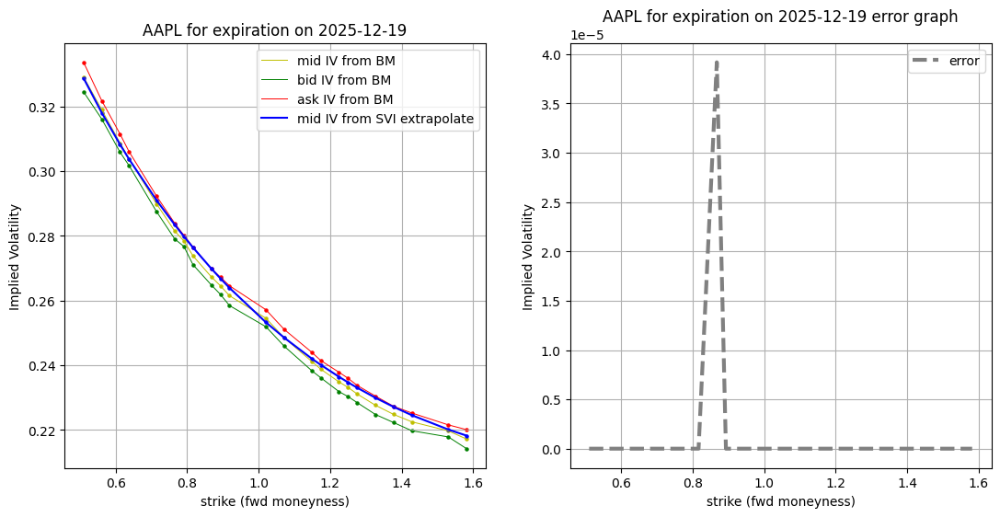

SVI(a=-0.21735067994344454, b=0.24293848741595003, rho=-0.05142271452223057, m=0.7492712108072822, sigma=1.3633725371976226)


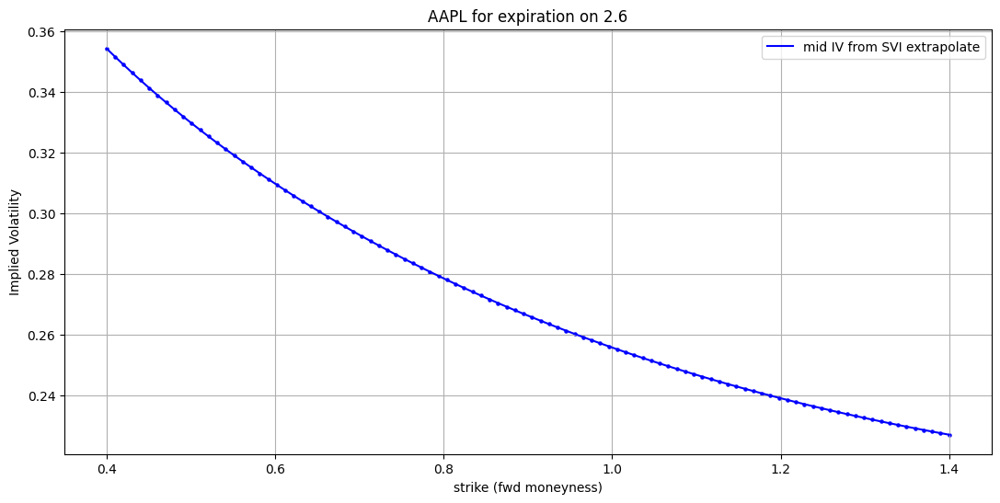

SVI(a=-0.28996735617471214, b=0.25247201653965673, rho=-0.07759684376661014, m=0.8290890794128116, sigma=1.6825469769854717)


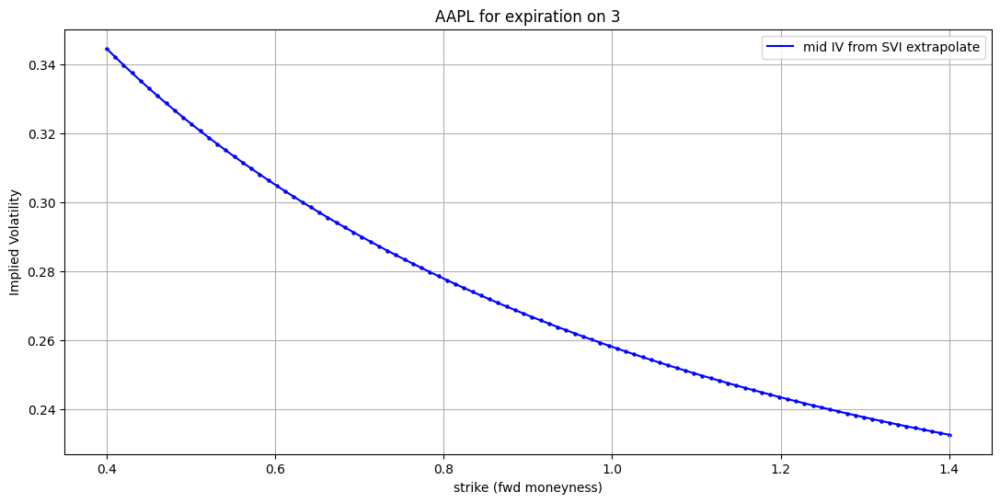

SVI(a=-0.4177141960648517, b=0.2642934637562564, rho=-0.10402349276015777, m=0.9289961943099844, sigma=2.1951132412713985)


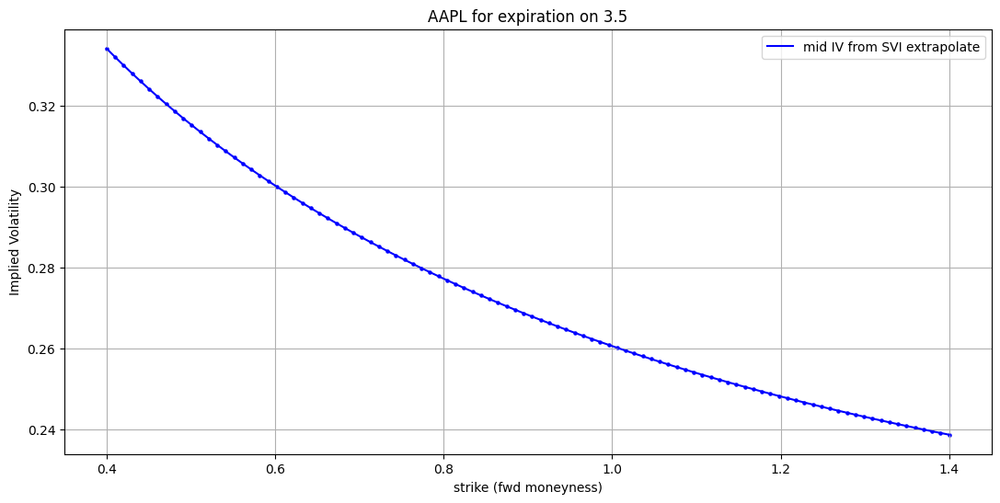

SVI(a=-0.6040484357032293, b=0.275906459113185, rho=-0.12534909140871475, m=1.0265913057799776, sigma=2.884859202432185)


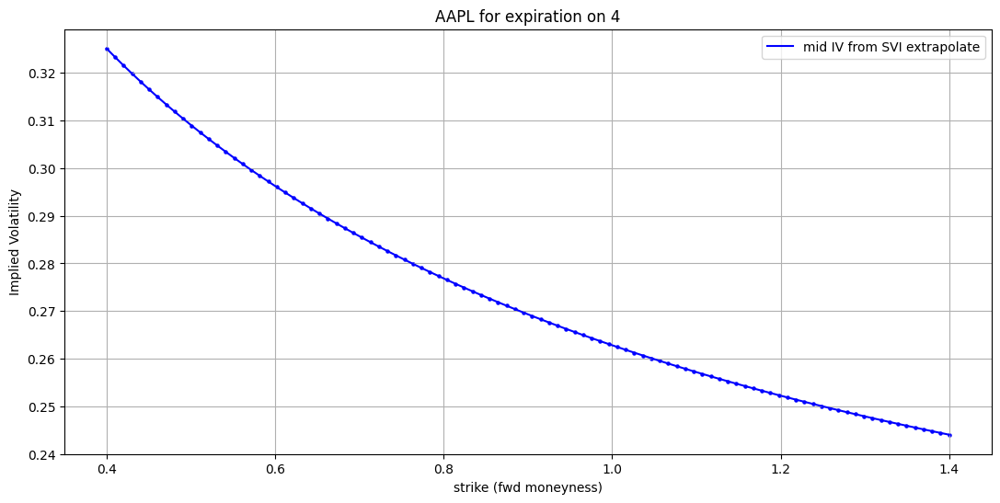

SVI(a=-0.8790864287750048, b=0.28726439085076855, rho=-0.14292059893299514, m=1.1160709827163793, sigma=3.839298206064936)


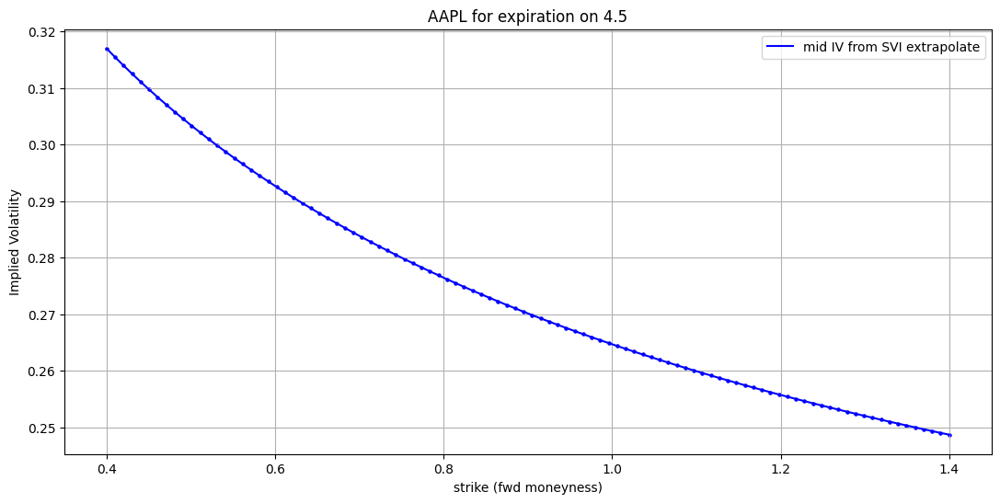

SVI(a=-1.2949120083829222, b=0.29835248802168424, rho=-0.15764910977818802, m=1.184827653916346, sigma=5.209178515520363)


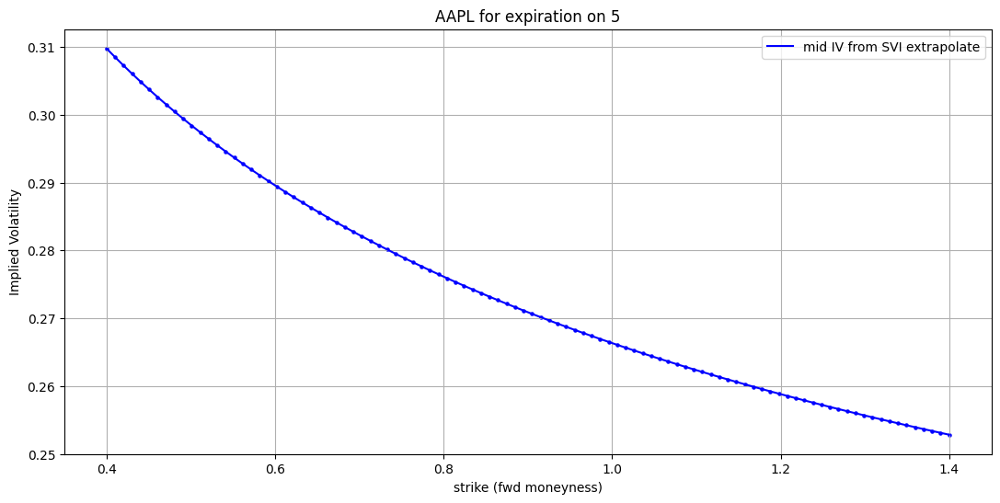

SVI(a=-1.947939972878996, b=0.3091712025522271, rho=-0.1701729613018912, m=1.2049867534707683, sigma=7.272146098123764)


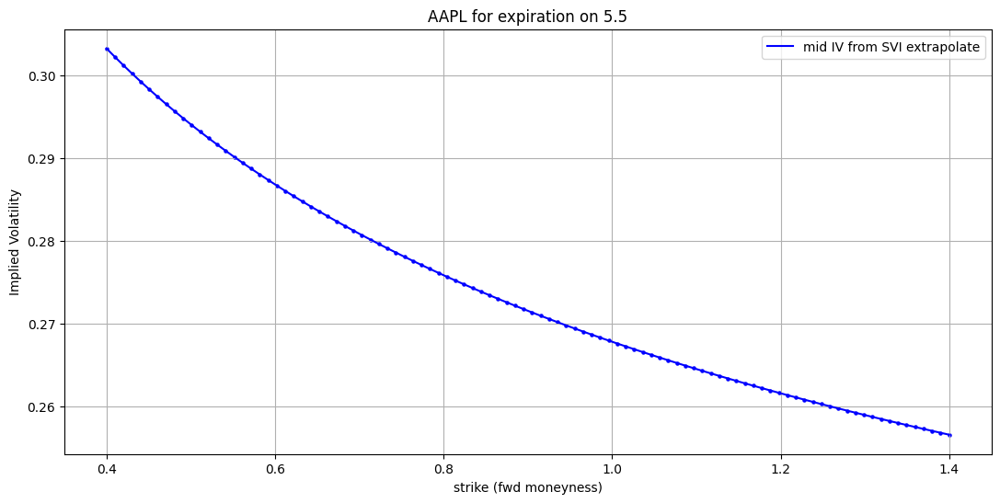

SVI(a=-3.0330950116935087, b=0.3197282941353218, rho=-0.18095269658664082, m=1.1112406549759353, sigma=10.586370934747102)


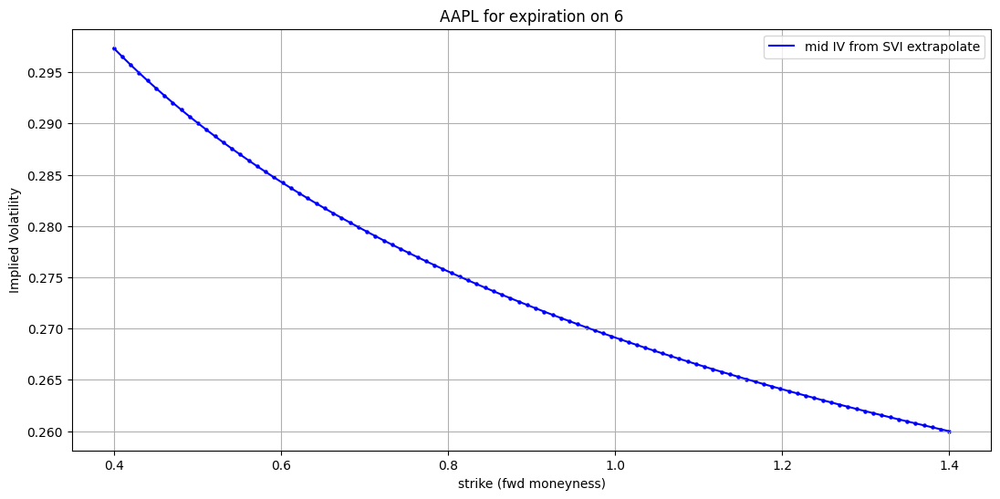

In [19]:
for timetable in range(0,len(Implied_Volatility_without_extrapolation['implied_volatility_surface'])):
    expiry_time = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timetable]['expiry_date_in_act365_year_fraction']
    a,b,rho,m,sigma,w_volatility = get_SVI_extrapolation(Implied_Volatility_without_extrapolation, expiry_time, start_v, start_v_tilda, end_psi, start_c, start_p,0, 0, type_reggresion = 'polynomial')
    n = SVI(a,b,rho,m,sigma)
    lines_2D_SVI_for_interpolate(ticker, Implied_Volatility_without_extrapolation, timetable, n)

for expiry_time in [2.6,3,3.5,4,4.5,5,5.5,6]:
    a,b,rho,m,sigma,w_volatility = get_SVI_extrapolation(Implied_Volatility_without_extrapolation, expiry_time, start_v, start_v_tilda, end_psi, start_c, start_p,0, 0, type_reggresion = 'polynomial')
    n = SVI(a,b,rho,m,sigma)
    print(n)
    T_ACT_365 = expiry_time
    grid = np.log(np.linspace(0.4,1.4, 100))
    w_SVI_total_variance = np.linspace(0,0,len(grid))
    for cnd, c in enumerate(grid):
        w_SVI_total_variance[cnd] = get_w_SVI_raw(n.a,n.b,n.rho,n.m,n.sigma, c) # compute total varience for given parameters
    w_volatility = np.sqrt(w_SVI_total_variance / T_ACT_365) 
    fig = plt.figure(figsize=(13, 6))
    plt.scatter(np.exp(grid), w_volatility, s = 5, color='b')
    plt.plot(np.exp(grid), w_volatility, label= 'mid IV from SVI extrapolate', color='b', linewidth=1.5)
    plt.title(ticker + ' for expiration on '+ str(expiry_time))
    plt.xlabel(r'strike (fwd moneyness)')
    plt.ylabel(r'Implied Volatility')
    plt.legend()
    plt.grid()
    plt.show()

SVI(a=-0.07420161895809035, b=0.2099197540838677, rho=0.22495585267996376, m=0.37059260508629516, sigma=0.48944068688442616)
0.7133333333333334
1.2866666666666666
0.7


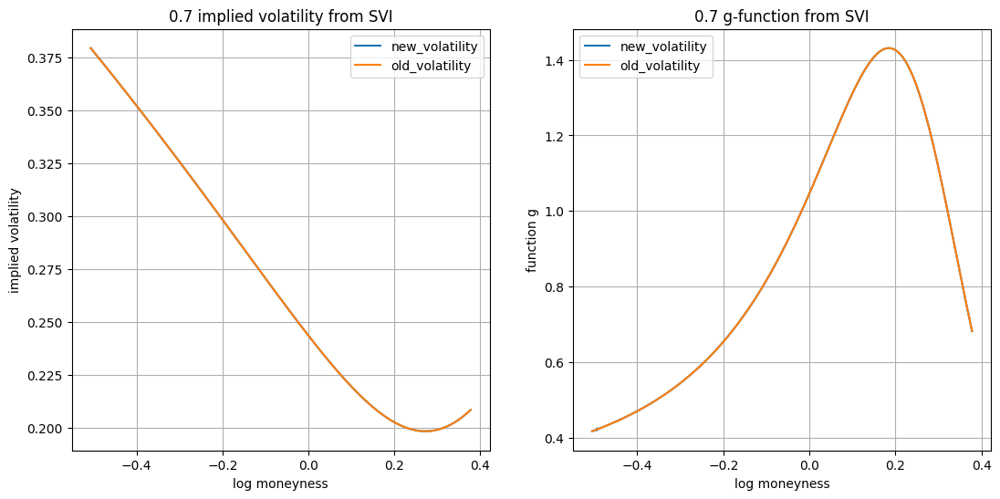

SVI(a=-0.07914067116811632, b=0.20951203079580227, rho=0.17209305105290262, m=0.4133214211052044, sigma=0.5494387409725848)
0.7000000000000001
1.3
0.9


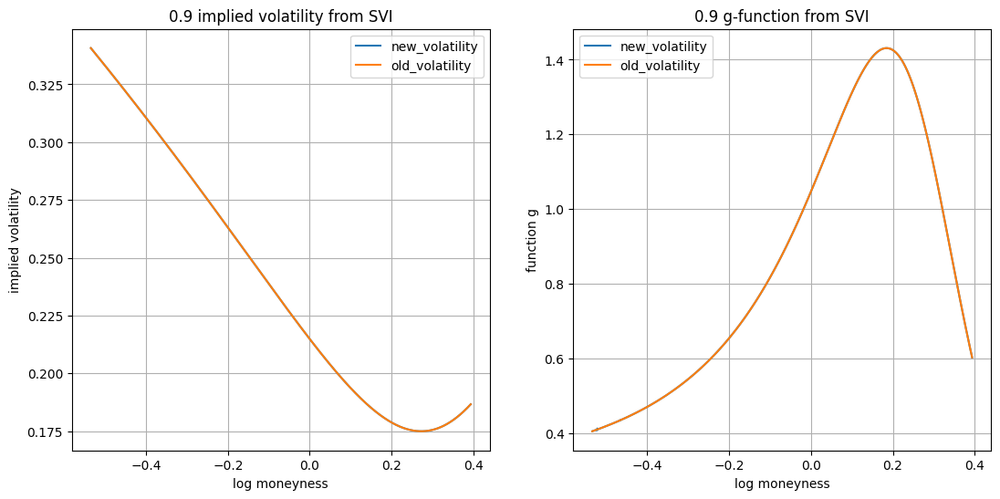

SVI(a=-0.08574792812797732, b=0.211298486162106, rho=0.1285018676042312, m=0.4539504994791819, sigma=0.6138004480630811)
0.6866666666666668
1.3133333333333332
1.1


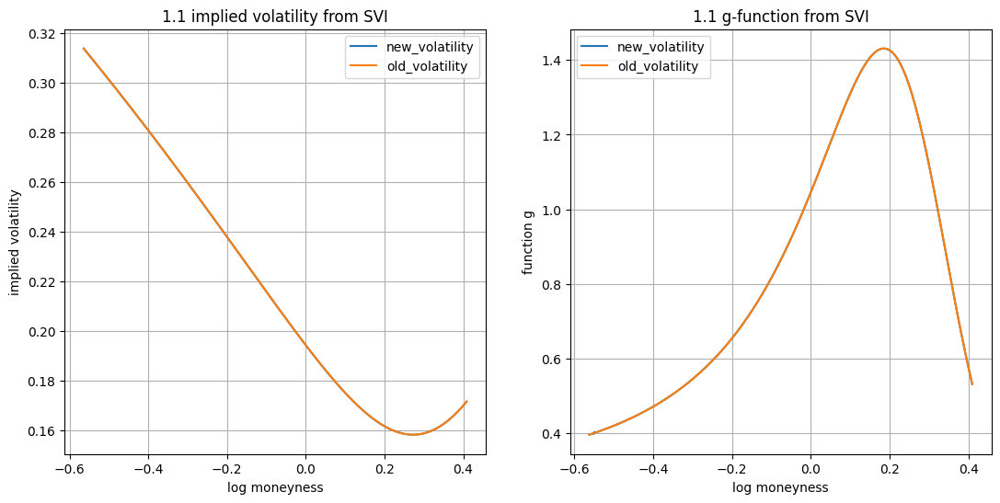

SVI(a=-0.0897684340485873, b=0.21268310781175911, rho=0.1094528935628698, m=0.4738733548561551, sigma=0.6482186540768541)
0.68
1.3199999999999998
1.2


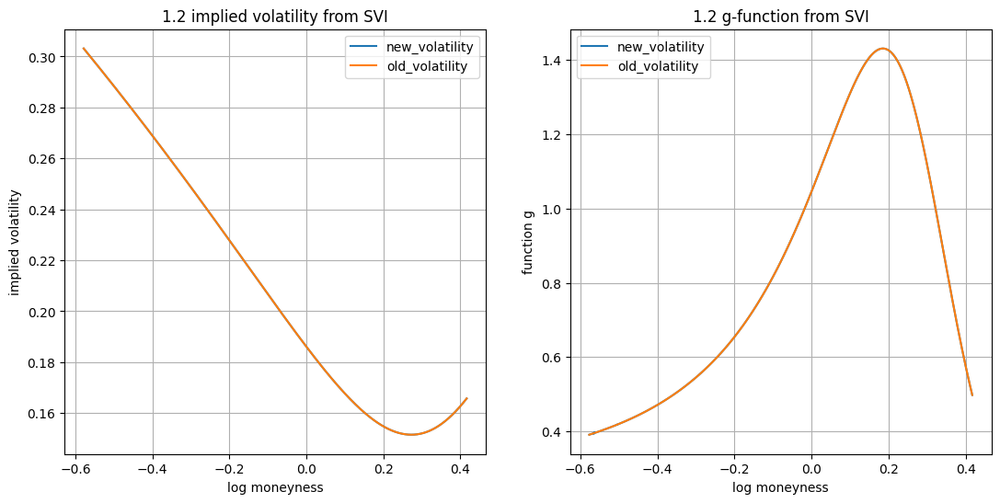

SVI(a=-0.09939515982752636, b=0.21607865148892633, rho=0.07578385979999724, m=0.5133139641734847, sigma=0.7222565028781505)
0.6666666666666667
1.3333333333333333
1.4


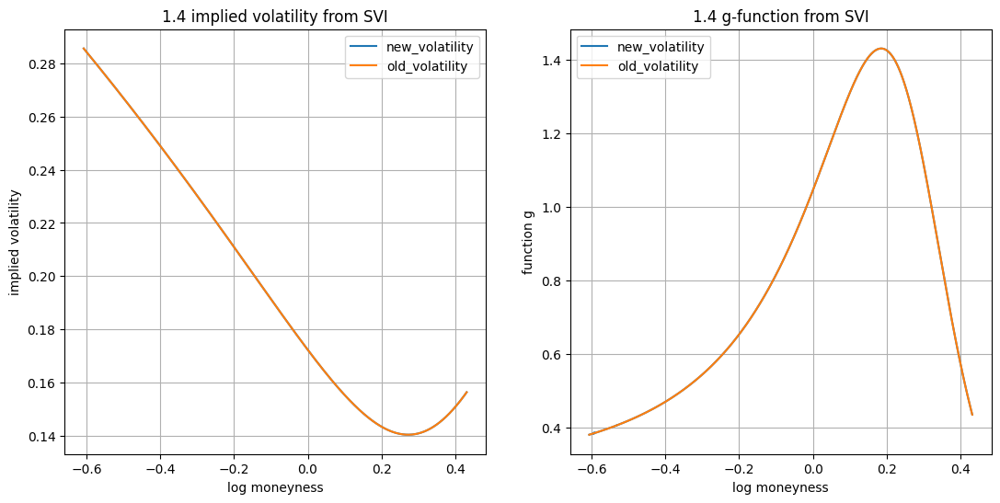

SVI(a=-0.11827794935043476, b=0.22214241196081763, rho=0.0340463723768778, m=0.5720513480998083, sigma=0.8480601115710937)
0.6466666666666667
1.3533333333333333
1.7


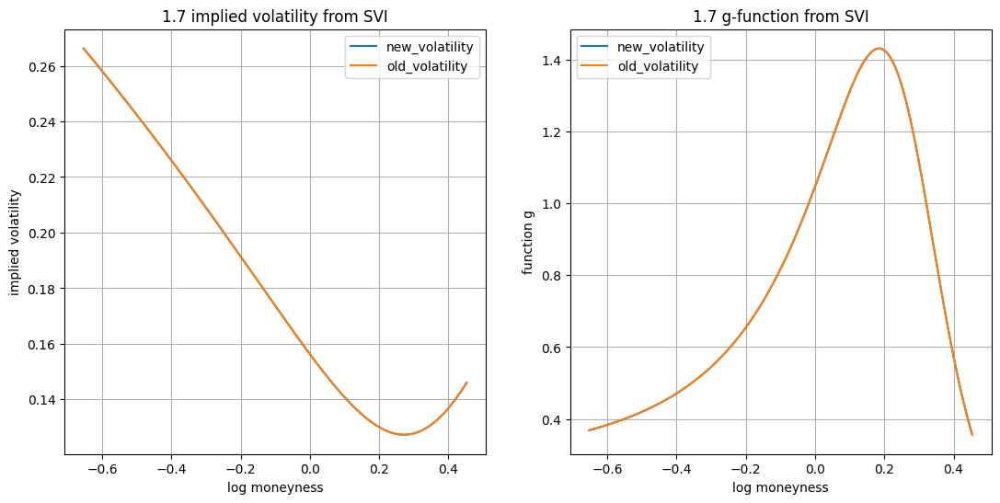

SVI(a=-0.12589844820428256, b=0.22432264339783484, rho=0.022000931627923492, m=0.591612992433481, sigma=0.894380234106359)
0.64
1.3599999999999999
1.8


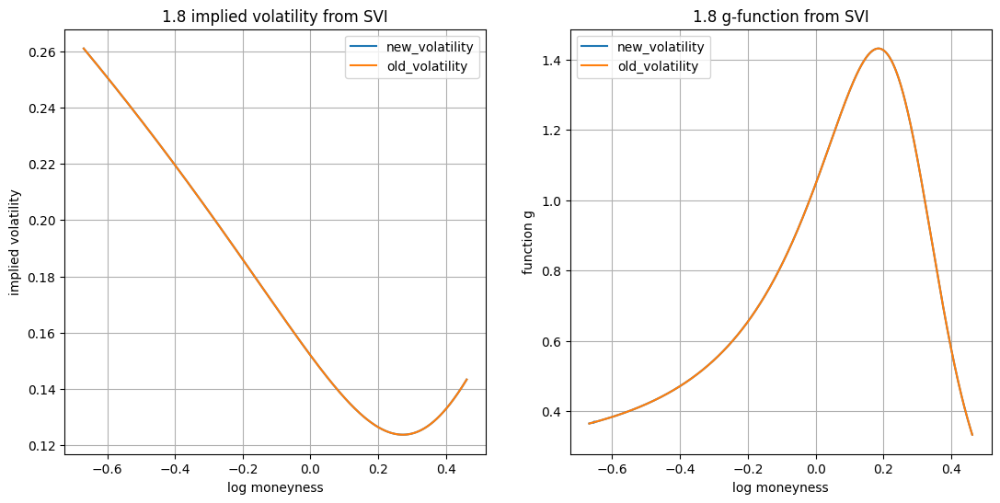

SVI(a=-0.13424856471505803, b=0.22655563285964866, rho=0.010737502670745358, m=0.6111907399530402, sigma=0.9430929392797225)
0.6333333333333334
1.3666666666666667
1.9


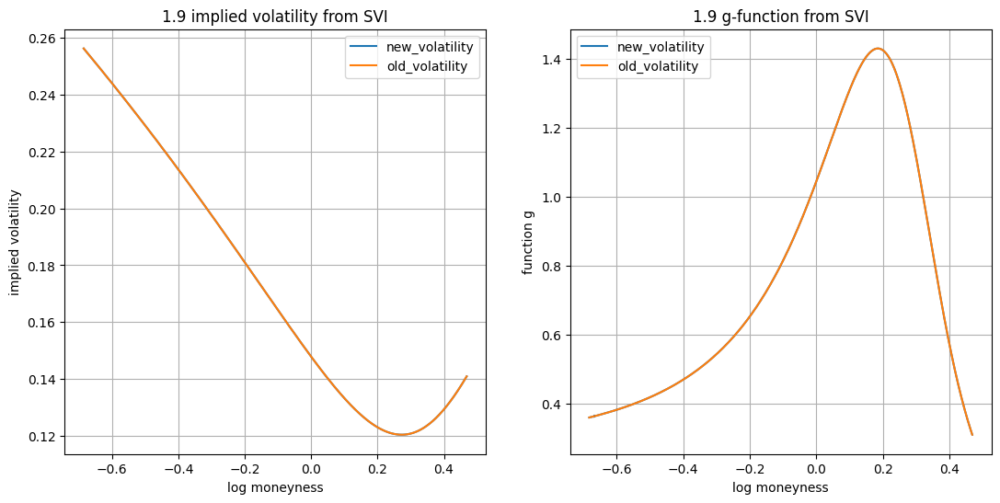

SVI(a=-0.15331913369960776, b=0.23113692554781065, rho=-0.009729366894628555, m=0.6504325253082457, sigma=1.0482275170623863)
0.6200000000000001
1.38
2.1


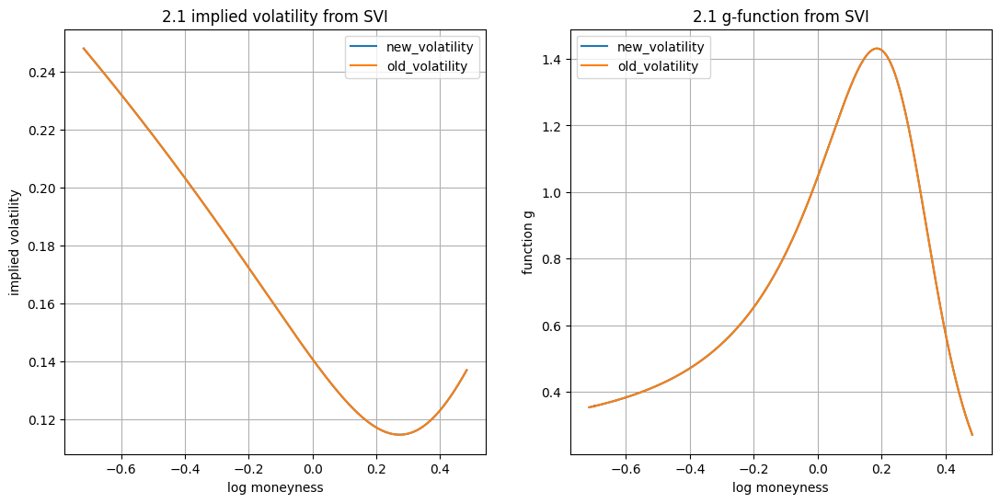

SVI(a=-0.16413937932721068, b=0.23346869512197613, rho=-0.019054677627661665, m=0.6701100305707234, sigma=1.1049395394845292)
0.6133333333333334
1.3866666666666667
2.2


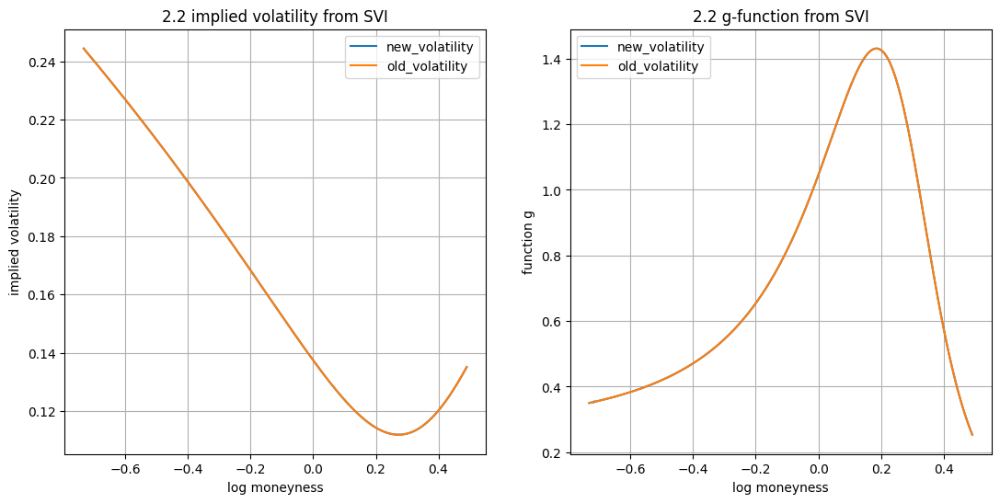

SVI(a=-0.17588952187736961, b=0.23581932927472174, rho=-0.02784414780319433, m=0.6898311432243862, sigma=1.1646270911069243)
0.6066666666666667
1.3933333333333333
2.3


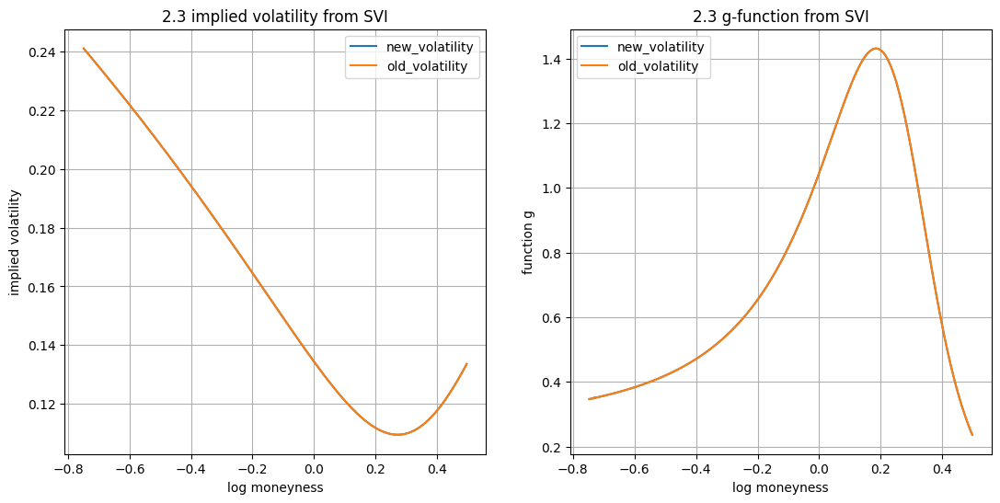

SVI(a=-0.18863013167470383, b=0.23818382034667307, rho=-0.036142672374144036, m=0.7095981677680577, sigma=1.227465656011518)
0.6000000000000001
1.4
2.4


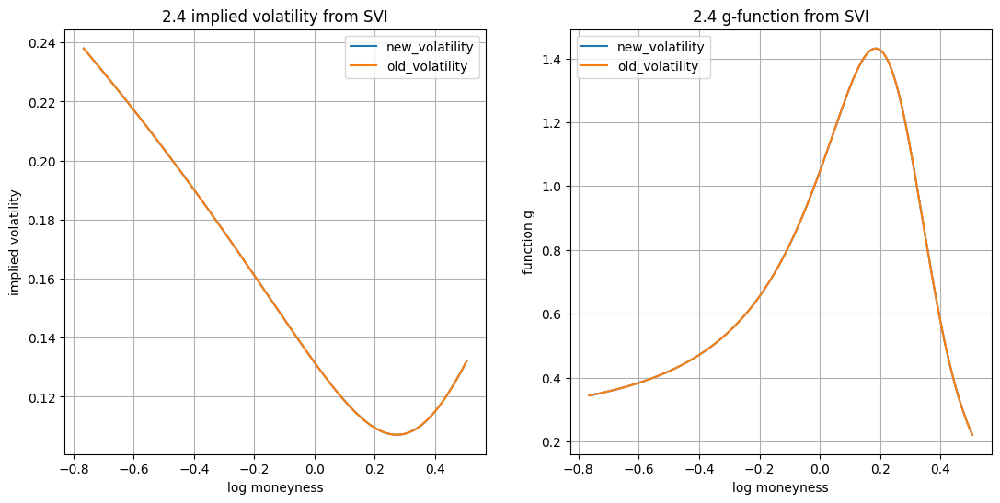

SVI(a=-0.21735067994344454, b=0.24293848741595003, rho=-0.05142271452223057, m=0.7492712108072822, sigma=1.3633725371976226)
0.5866666666666667
1.4133333333333333
2.6


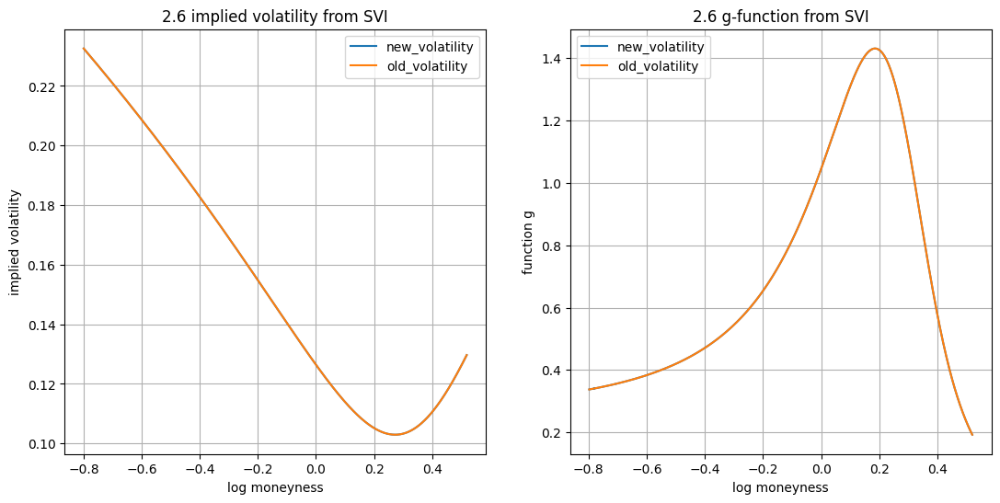

SVI(a=-0.2334789595993481, b=0.24532233945786044, rho=-0.05847210805542402, m=0.7691738322836463, sigma=1.4368713243643385)
0.5800000000000001
1.42
2.7


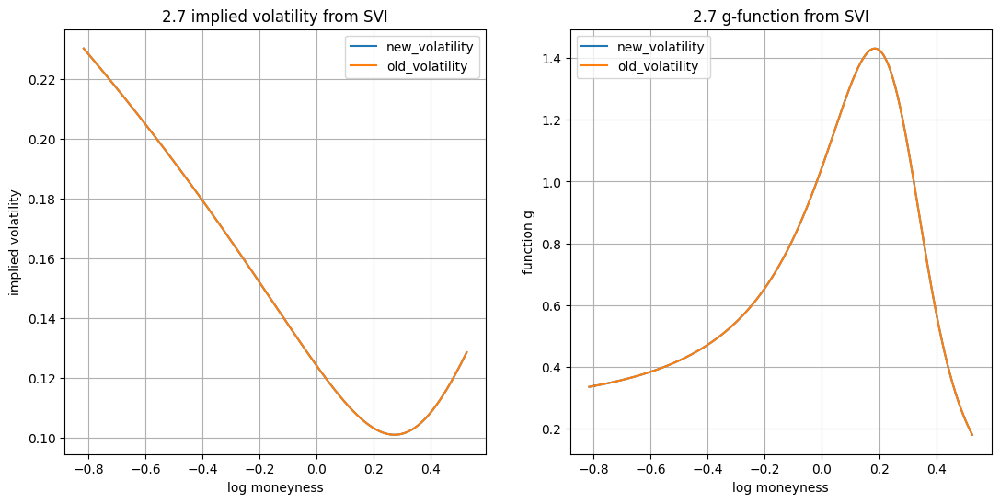

SVI(a=-0.2508955722169845, b=0.24770717090475358, rho=-0.06516731667682807, m=0.7891154322677425, sigma=1.5143855838235338)
0.5733333333333334
1.4266666666666665
2.8


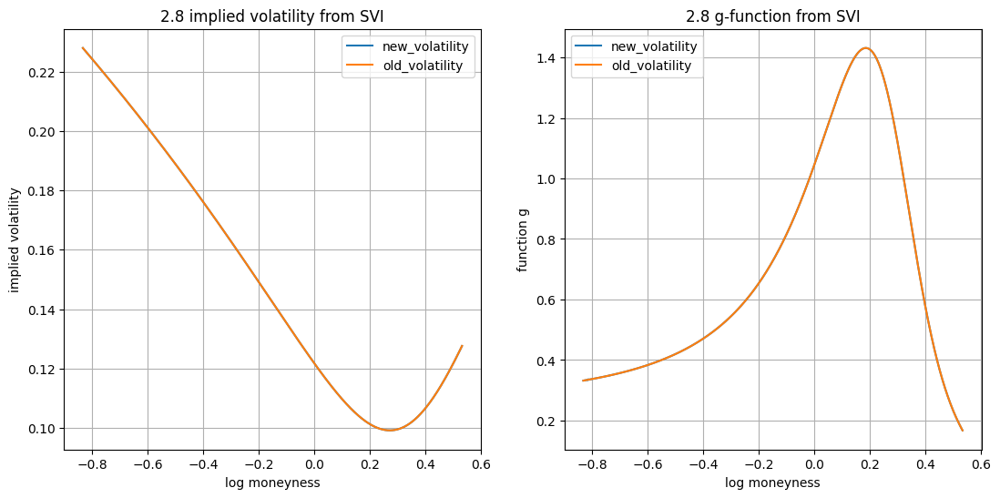

SVI(a=-0.2696918565496206, b=0.2500909622774509, rho=-0.07153437938076124, m=0.809089898251614, sigma=1.596180918652406)
0.5666666666666667
1.4333333333333333
2.9


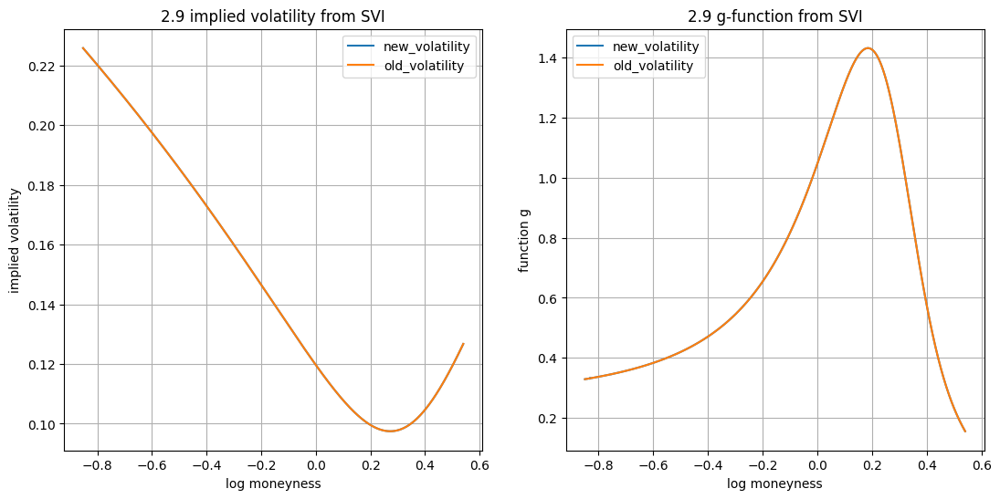

SVI(a=-0.28996735617471214, b=0.25247201653965673, rho=-0.07759684376661014, m=0.8290890794128116, sigma=1.6825469769854717)
0.56
1.44
3.0


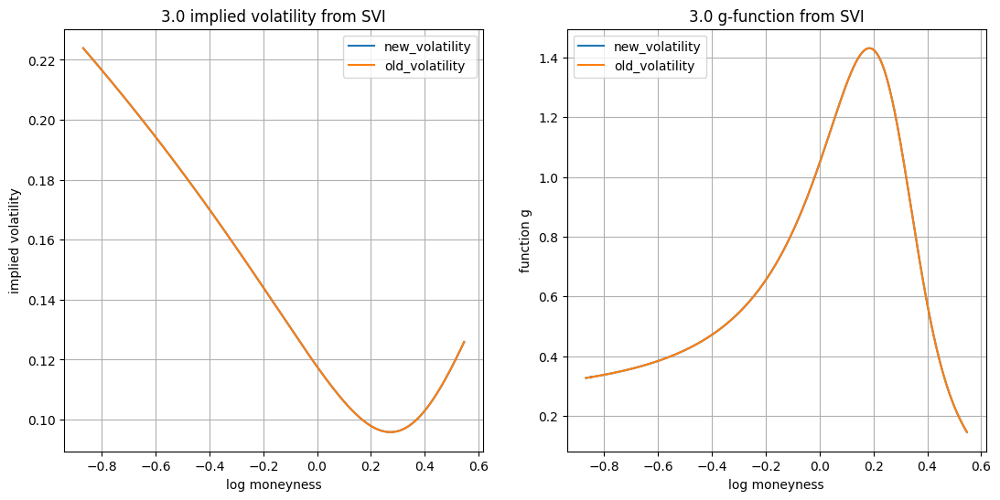

SVI(a=-0.3118307112944032, b=0.2548489059745454, rho=-0.08337605704687667, m=0.8491025687722757, sigma=1.7738000308408415)
0.5533333333333333
1.4466666666666665
3.1


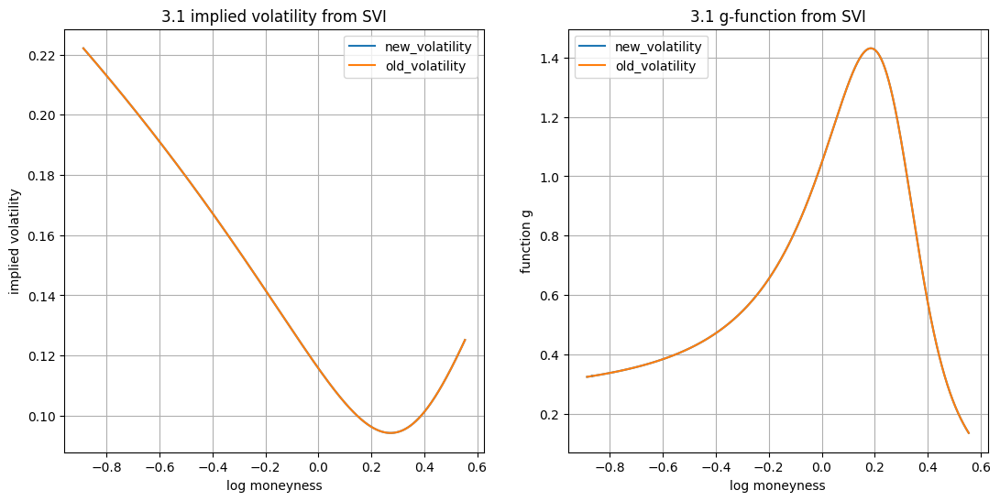

SVI(a=-0.3354006663572561, b=0.2572204288155365, rho=-0.08889141719683447, m=0.8691174387168012, sigma=1.8702858815932466)
0.5466666666666666
1.4533333333333334
3.2


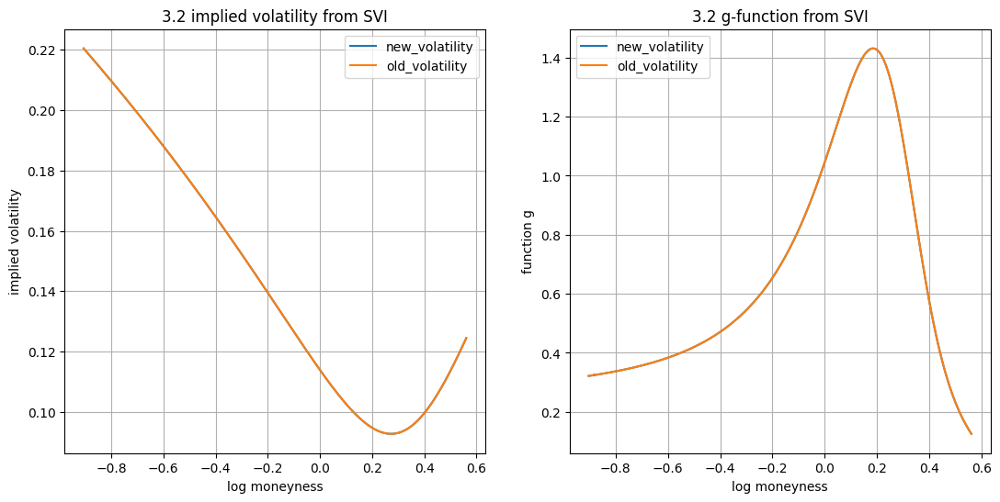

SVI(a=-0.36080721089105117, b=0.2595855736333266, rho=-0.09416059047278735, m=0.8891179249541106, sigma=1.9723831430982621)
0.54
1.46
3.3


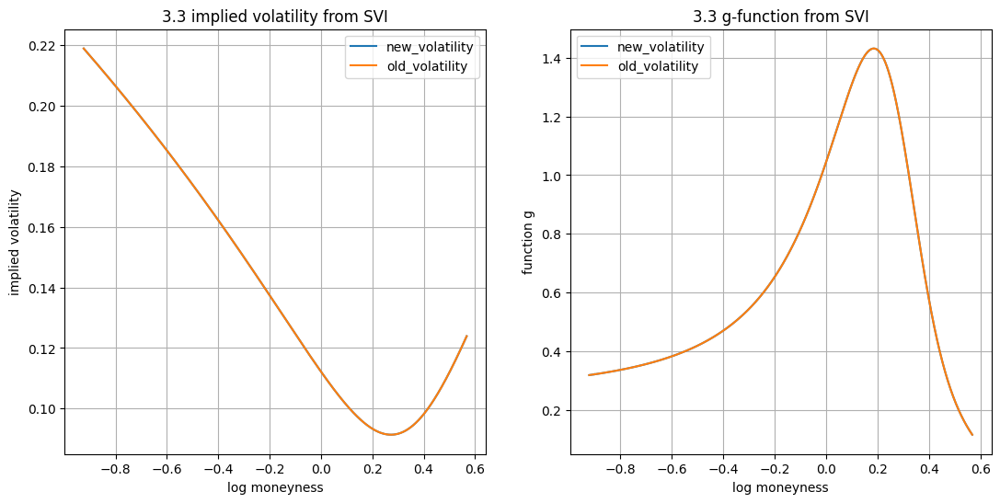

SVI(a=-0.38819287393703905, b=0.2619434899331177, rho=-0.09919970043840376, m=0.9090850523475335, sigma=2.080506961579196)
0.5333333333333334
1.4666666666666666
3.4


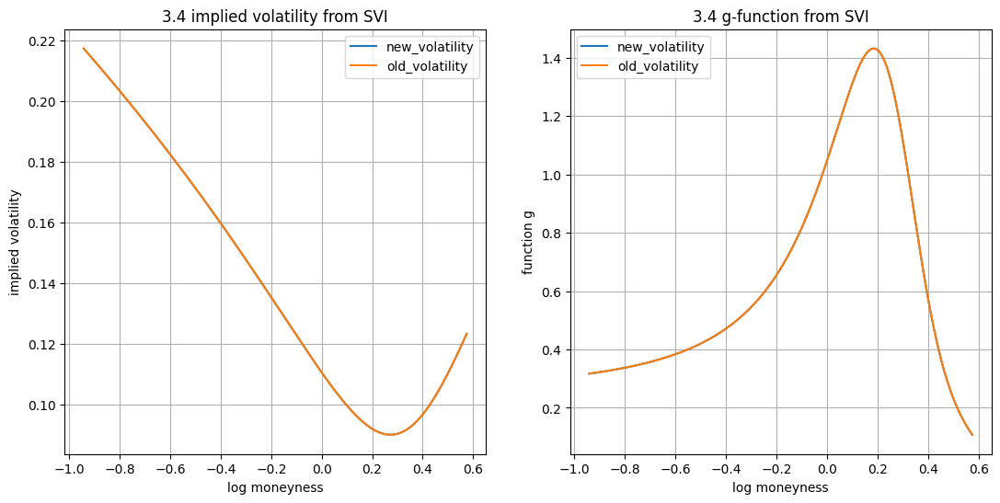

SVI(a=-0.4177141960648517, b=0.2642934637562564, rho=-0.10402349276015777, m=0.9289961943099844, sigma=2.1951132412713985)
0.5266666666666667
1.4733333333333332
3.5


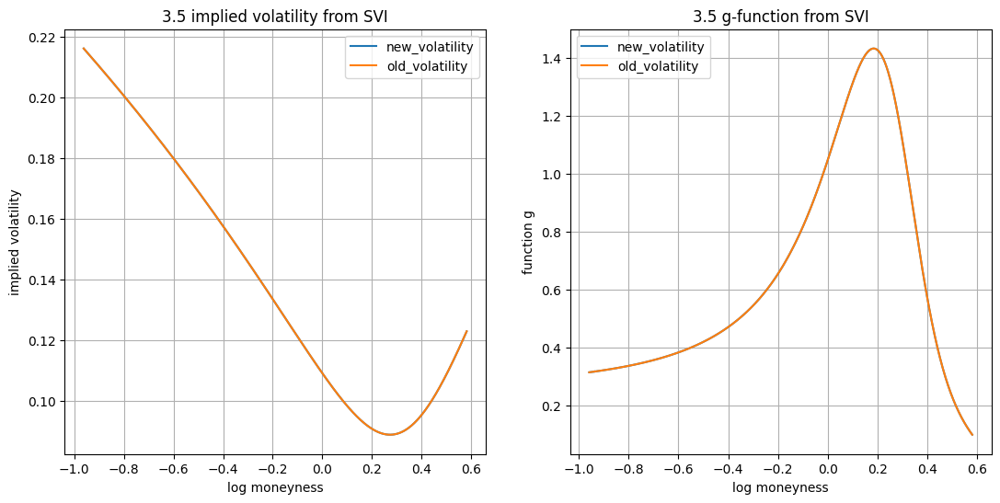

SVI(a=-0.4495434072516361, b=0.26663489733897244, rho=-0.10864547931987456, m=0.9488245554350929, sigma=2.3167034568043112)
0.52
1.48
3.6


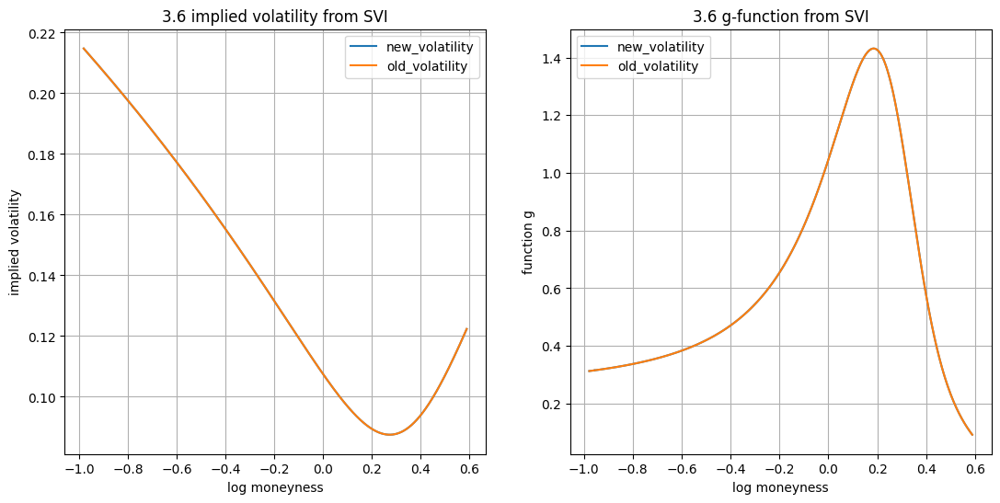

SVI(a=-0.48387034408824836, b=0.26896729207883985, rho=-0.11307806461080139, m=0.9685385647140349, sigma=2.445830147815952)
0.5133333333333334
1.4866666666666666
3.7


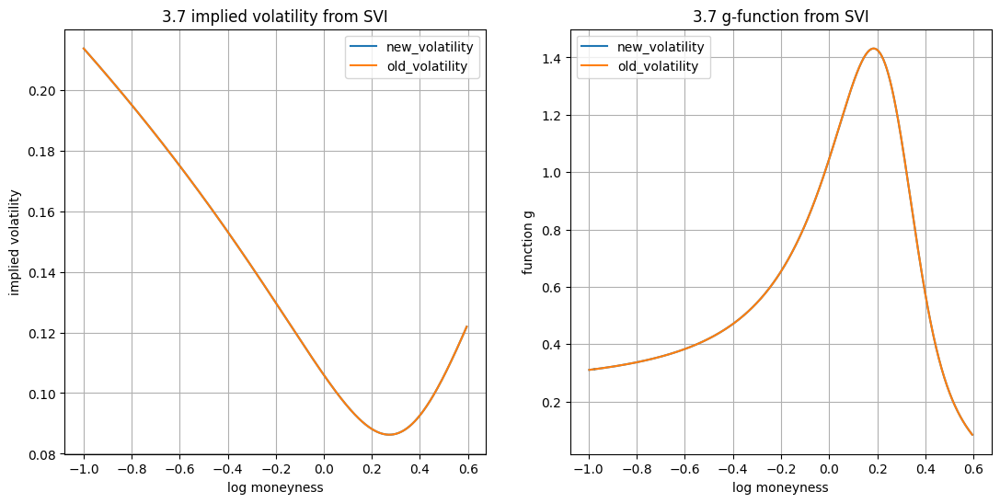

SVI(a=-0.5209046460284192, b=0.27129023421233234, rho=-0.11733265690715977, m=0.9881011639237177, sigma=2.583103208882035)
0.5066666666666667
1.4933333333333332
3.8


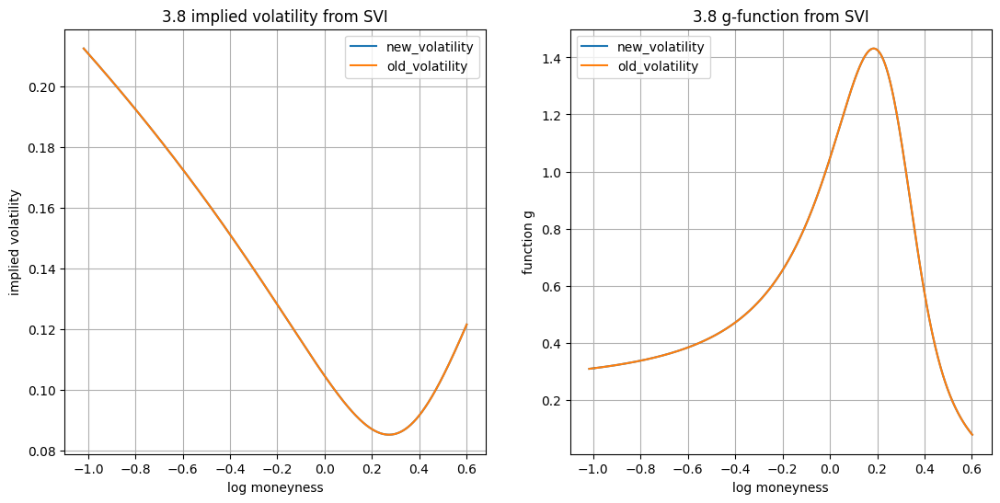

SVI(a=-0.560878277973774, b=0.2736033827255615, rho=-0.12141976630506224, m=1.0074689724504666, sigma=2.7291971091957317)
0.5
1.5
3.9


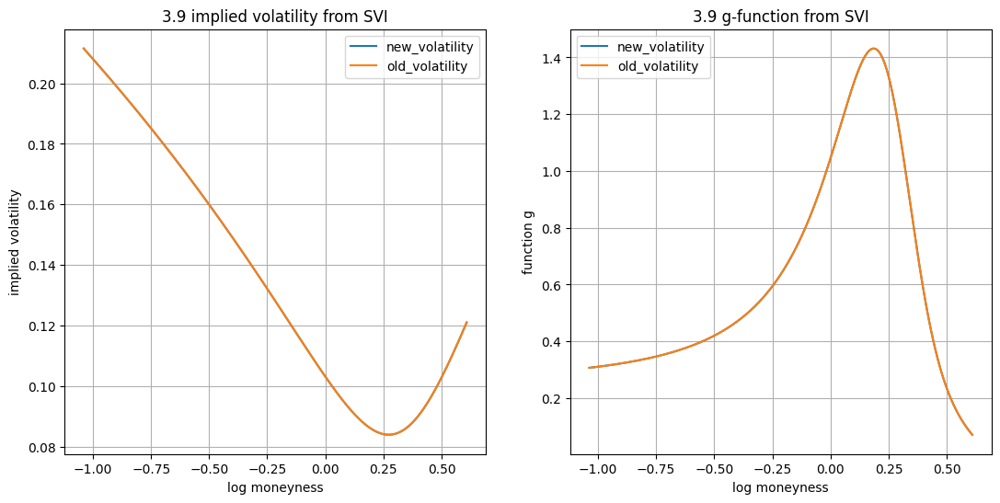

SVI(a=-0.6040484357032293, b=0.275906459113185, rho=-0.12534909140871475, m=1.0265913057799776, sigma=2.884859202432185)
0.4933333333333334
1.5066666666666666
4.0


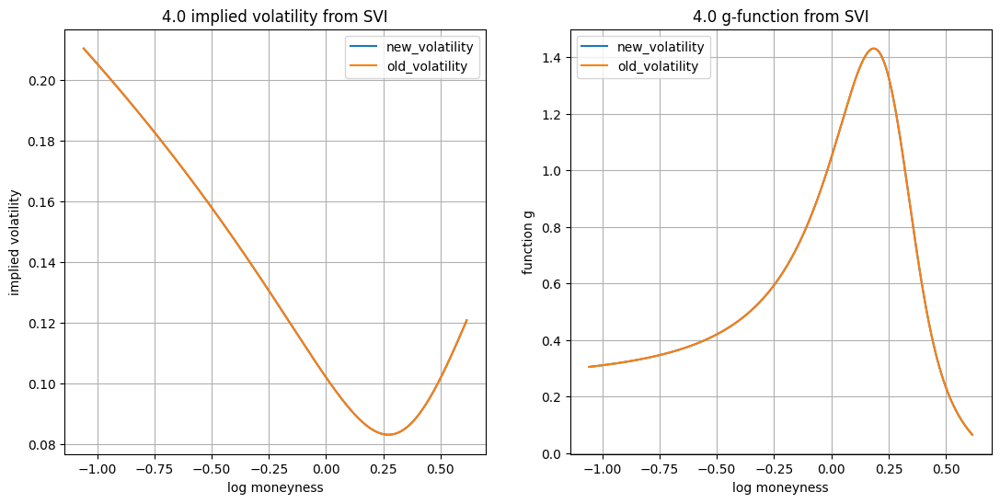

SVI(a=-0.6507009019081642, b=0.27819923867363605, rho=-0.12912959616708952, m=1.0454090199481505, sigma=3.0509193189901223)
0.4866666666666667
1.5133333333333332
4.1


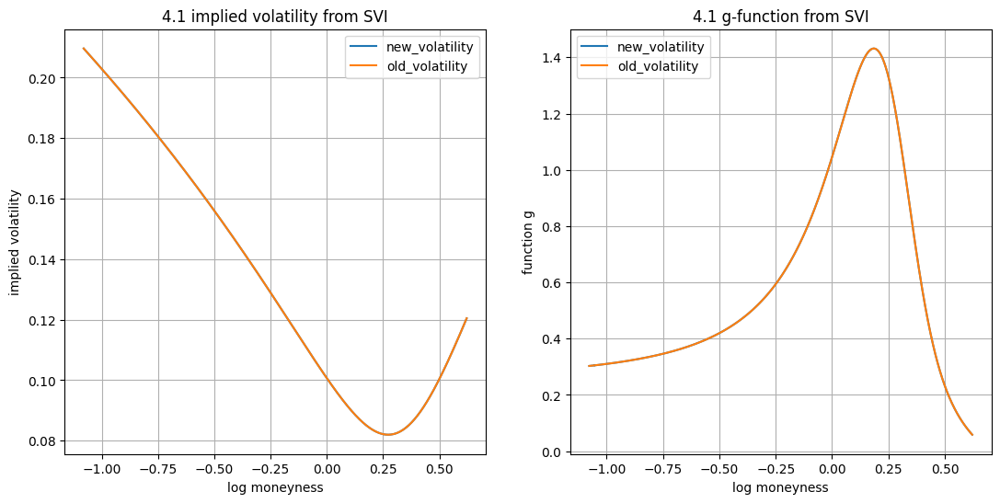

SVI(a=-0.7011539343913009, b=0.28048154308678713, rho=-0.13276957814245294, m=1.063853148167243, sigma=3.228300871741536)
0.48000000000000004
1.52
4.2


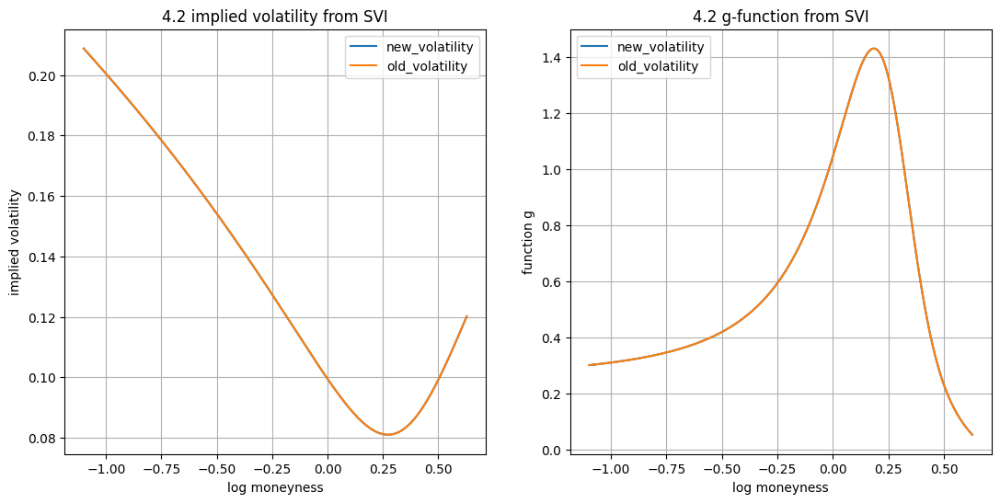

SVI(a=-0.7557627849746281, b=0.2827532340663563, rho=-0.13627672930509482, m=1.081843288309382, sigma=3.418033754355933)
0.4733333333333334
1.5266666666666666
4.3


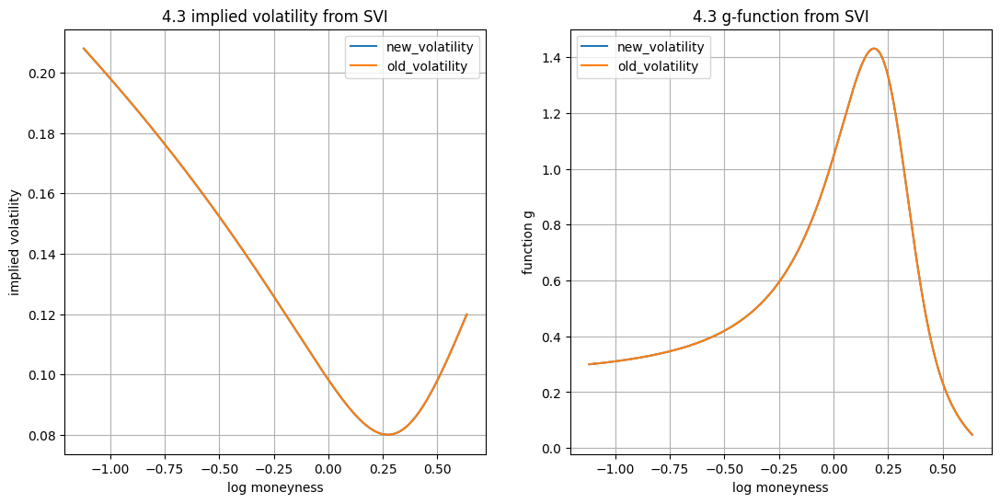

SVI(a=-0.8149249686707046, b=0.28501420791636595, rho=-0.13965819029172688, m=1.0992856905483162, sigma=3.6212693705306505)
0.46666666666666673
1.5333333333333332
4.4


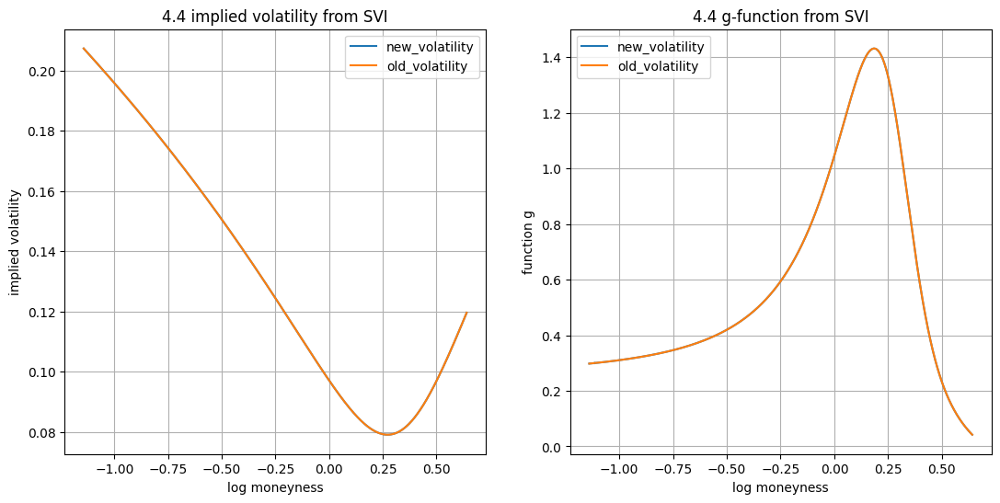

SVI(a=-0.8790864287750048, b=0.28726439085076855, rho=-0.14292059893299514, m=1.1160709827163793, sigma=3.839298206064936)
0.46
1.54
4.5


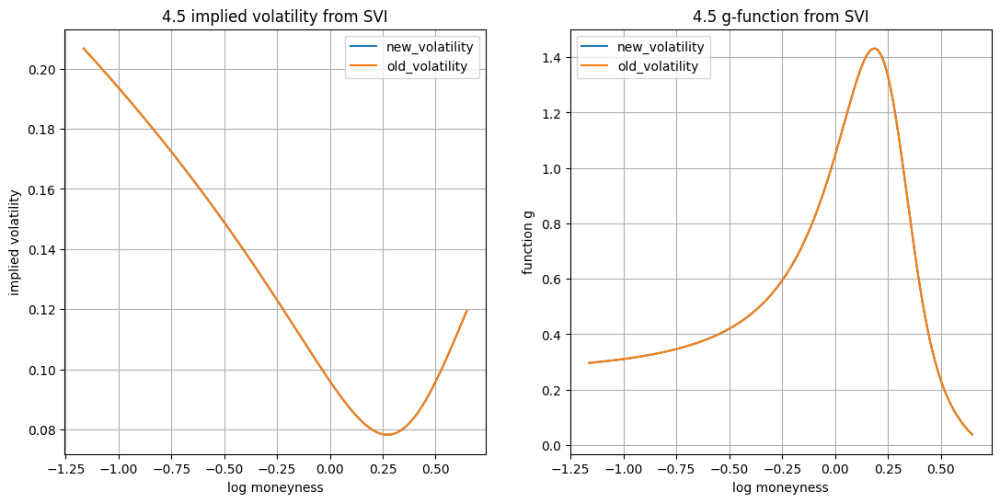

SVI(a=-0.9487487761263234, b=0.28950373495947174, rho=-0.1460701337440813, m=1.1320714561557028, sigma=4.073570447569306)
0.45333333333333337
1.5466666666666666
4.6


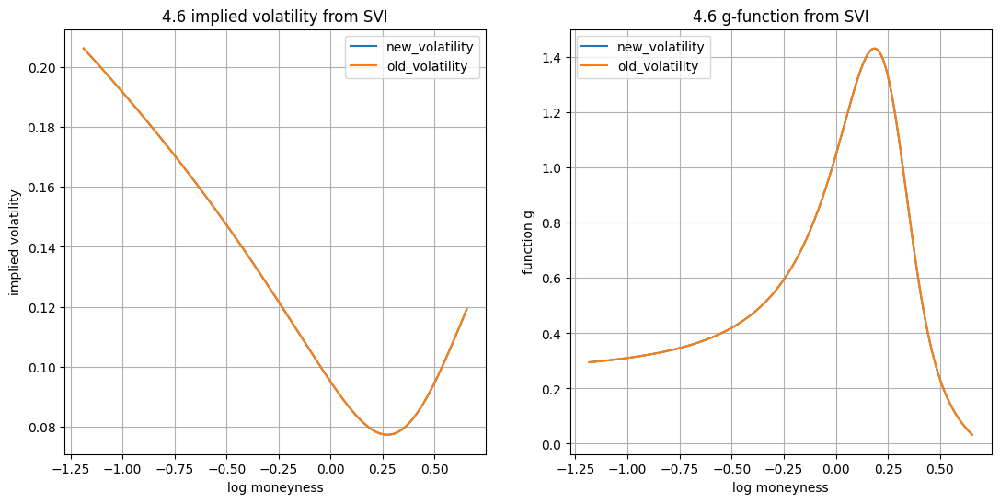

SVI(a=-1.0244778216759136, b=0.291732214723599, rho=-0.14911255297796422, m=1.14713781615072, sigma=4.32572026680602)
0.4466666666666667
1.5533333333333332
4.7


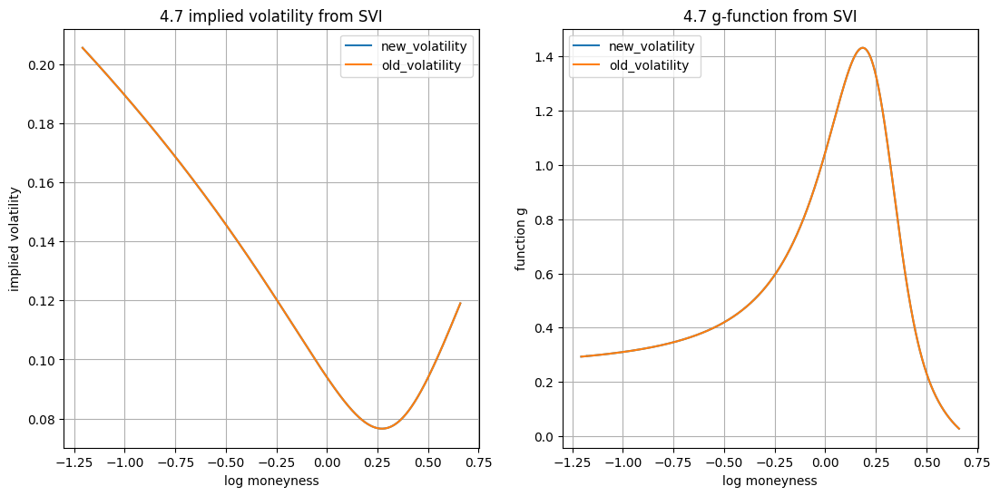

SVI(a=-1.1069136730910918, b=0.29394982399884106, rho=-0.15205322976070335, m=1.1610952772582246, sigma=4.597594534907248)
0.44000000000000006
1.56
4.8


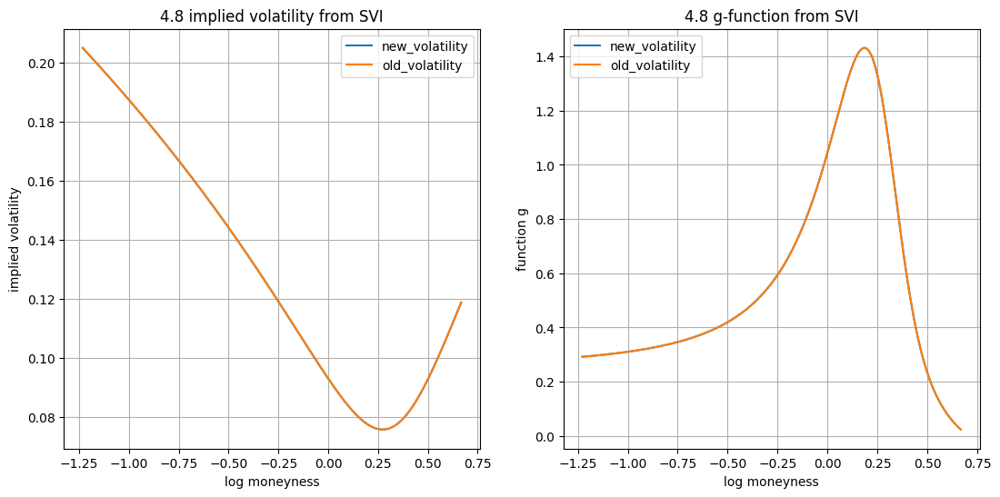

SVI(a=-1.1967827315520847, b=0.29615657339888024, rho=-0.1548971837597859, m=1.1737388534538158, sigma=4.891286914866377)
0.4333333333333334
1.5666666666666667
4.9


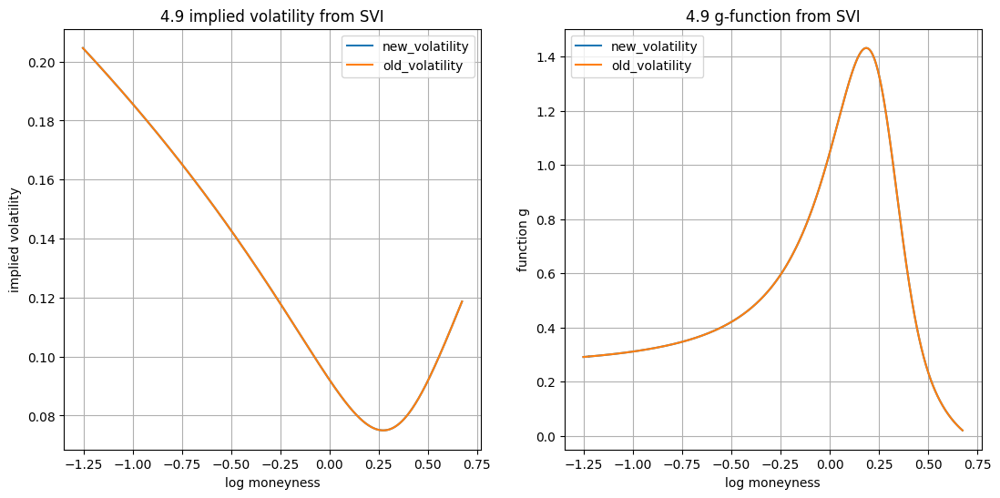

In [20]:
ranger = range(27,50)
lister_time = [0.7, 0.9, 1.1, 1.2, 1.4, 1.7,1.8,1.9,2.1,2.2,2.3,2.4,2.6] + list(np.array(ranger) / 10)
lister = [13,15,17,18,20,23,24,25,27,28,29,30,32] + list(range(33, 33 + len(ranger)))
coef = 1.5
index = 0
for expiry_time in lister_time:
    a,b,rho,m,sigma,w_volatility = get_SVI_extrapolation(Implied_Volatility_without_extrapolation, expiry_time, start_v, start_v_tilda, end_psi, start_c, start_p,0, 0, type_reggresion = 'polynomial')
    n = SVI(a,b,rho,m,sigma)
    print(n)
    t = expiry_time
    set_param_raw = Implied_Volatility_without_extrapolation['implied_volatility_surface'][timents]['set_param_raw']
    X_first = x_grid[lister[index]][0]
    X_last = x_grid[lister[index]][-1]
    print(X_first)
    print(X_last)
    X = np.linspace(np.log(X_first) * coef, np.log(X_last) * coef, 1000)
    expiry_date = str(expiry_time)
    index +=1
    print(t)
    get_g_function_for_butterfly_arbitrage(X, set_param_raw, expiry_date, coef, t, graph=True, N=1000)

####  Calendar arbitrage
$C(T_1,K) > C(T_2,K),\:for\:some\ T_1 < T_2\:and\:K > 0$
Then we can get arbitrage by selling the option call $(T1;K)$ and buying the option call $(T2;K)$

Calendar arbitrage is absence if and only if $\partial_t W(x,t) \geqslant 0$, where $W(x,t) -$ total implied varience, $x \in \mathbb{R}$ 

It means that no one total variance curves aren't cross. Follow graph show this crosdering

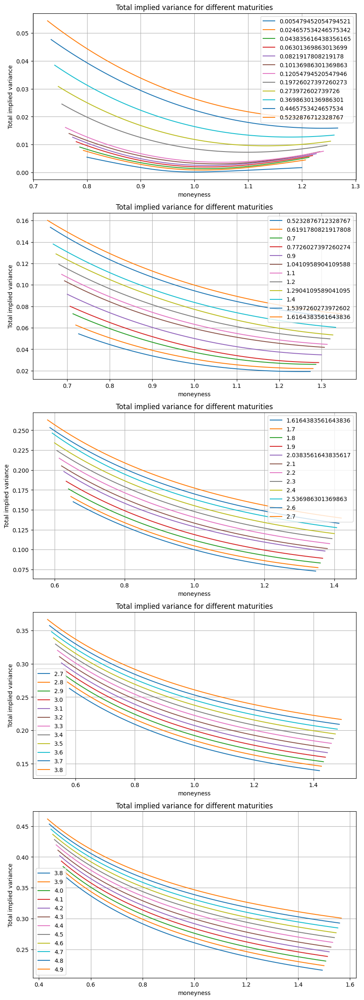

In [21]:
ranger = range(27,50)
lister_time = [0.7, 0.9, 1.1, 1.2, 1.4, 1.7,1.8,1.9,2.1,2.2,2.3,2.4,2.6] + list(np.array(ranger) / 10)
lister = [13,15,17,18,20,23,24,25,27,28,29,30,32] + list(range(33, 33 + len(ranger)))
get_graph_for_check_arbitrage_for_different_maturities(Implied_Volatility_without_extrapolation, lister_time, lister, x_grid)



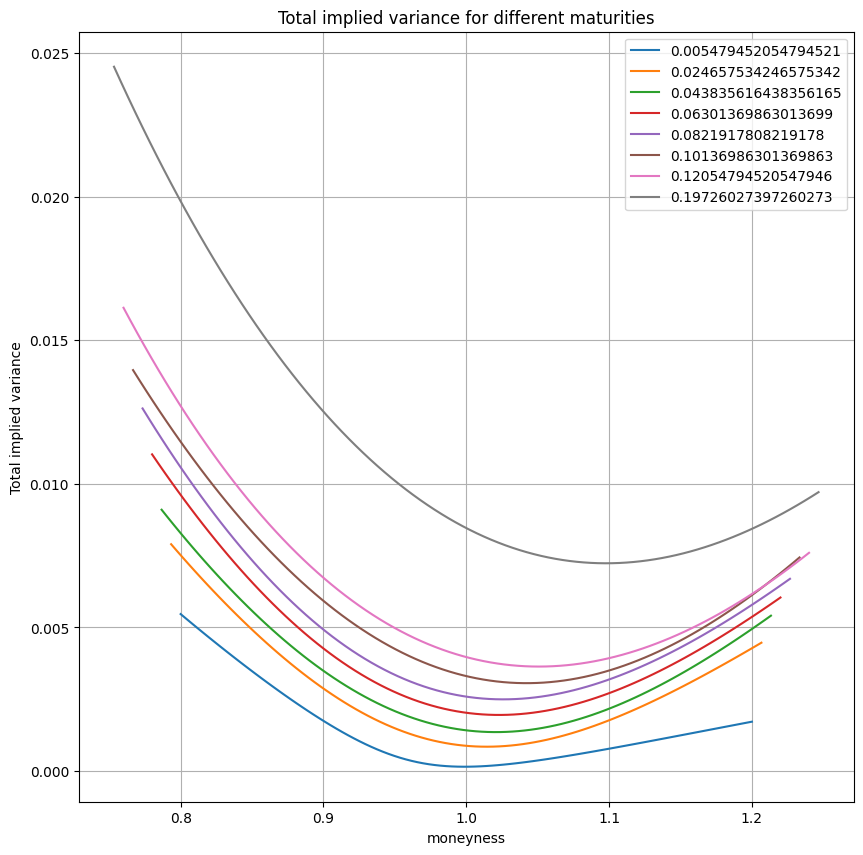

In [22]:
T_ACT_365 = lister_time 
start_v = 5
start_v_tilda = 6
end_psi = 8
start_c = 7
start_p = 4
number = len(T_ACT_365)

w_volatility = []
set_param = [0] * number
for i in lister:
    a, b, rho, m, sigma, _ = get_SVI_extrapolation(Implied_Volatility_without_extrapolation, T_ACT_365[i], start_v, start_v_tilda, end_psi, start_c, start_p,0, 0, type_reggresion = 'polynomial')
    set_param[i] = SVI(a, b, rho, m, sigma)
#     print(set_param)
# for k in Implied_Volatility_without_extrapolation['implied_volatility_surface']:    
for ind, i in enumerate([0,1,2,3,4,5,6,7,8,9,10,11,12,14,16,19,21,22,26,31]):
    set_param[i] = Implied_Volatility_without_extrapolation['implied_volatility_surface'][ind]['set_param_raw']

fig = plt.figure(figsize=(10,10))
for i in range(0, 8):
    w_volatility = np.linspace(0,0, 100)
    for xnd,x in enumerate(np.log(x_grid[i])):
        w_volatility[xnd] = get_w_SVI_raw(set_param[i].a,set_param[i].b,set_param[i].rho,set_param[i].m,set_param[i].sigma, x)
    plt.plot(x_grid[i], w_volatility, label=T_ACT_365[i])
#     ax1.scatter(x_grid[i], w_volatility, s=3)
plt.title('Total implied variance for different maturities')
plt.xlabel(r'moneyness')
plt.ylabel(r'Total implied variance')
plt.grid()
plt.legend()

In [23]:
limit_price = []
for k in set_param:
    print(k.b * (1 + k.rho))
    if not (k.b * (1 + k.rho) < 2):
        limit_price.append(k['expiry_date'])
print(limit_price)

0.012492819528536125
0.049766615233758894
0.07419207733683277
0.07550645886381442
0.08380861475529634
0.1484045335710746
0.29646352574180407
0.31053780437301504
0.31336390967014915
0.39814151287668953
0.16211558014770017
0.2451387622407702
0.39986828279546643
0.2571424313581725
0.2797888256600037
0.2455675954077416
0.20336317746905852
0.2384507362558834
0.23596188937369994
0.2360739347545009
0.23245392571913562
0.19496027477912115
0.15922087824626388
0.2297055552391334
0.22925795053782566
0.22898827457255153
0.3381828240171508
0.22888810959625955
0.22902002440027605
0.22925314101554622
0.2295752205630613
0.19914025136752125
0.23044593093109714
0.230977825116671
0.23156475925528233
0.2322008605021961
0.23288098491678796
0.2336006090516776
0.23435574036614595
0.23514284274179537
0.23595877419996242
0.23680073454265044
0.23766622111417424
0.2385529912469565
0.23945903023923373
0.24038252393474932
0.24132183514955155
0.24227548332971768
0.24324212693441016
0.24422054812735533
0.24520963943

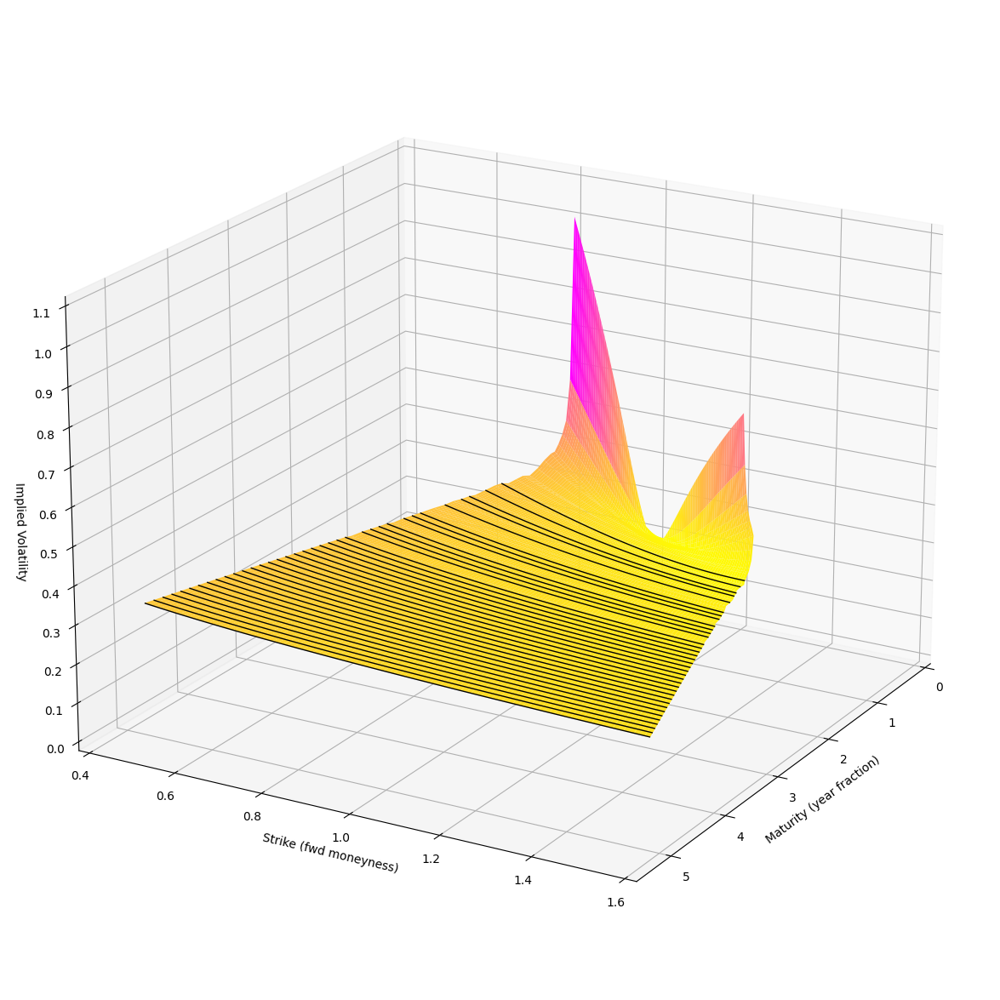

In [24]:
fig = plt.figure(figsize=(40, 15))
ax_3d = fig.add_subplot(projection='3d')
ax_3d.plot_surface(t_grid, np.array(x_grid), np.array(volatility_grid), rstride=1, cstride=1, cmap='spring_r')
ax_3d.plot_wireframe(t_grid_1, np.array(x_grid_1), np.array(volatility_grid_1), rstride=1, cstride=0, linewidth=1, edgecolors='k')
# ax_3d.contourf(t_grid, np.array(x_grid), np.array(volatility_grid), rstride=1, cstride=1, cmap='cool')
# ax_3d.set_title(ticker)
ax_3d.set_xlabel(r'Maturity (year fraction)')
ax_3d.axes.set_xlim3d(left=0, right=5.5)
ax_3d.set_ylabel(r'Strike (fwd moneyness)')
ax_3d.axes.set_ylim3d(bottom=0.4, top=1.6)
ax_3d.set_zlabel(r'Implied Volatility')
ax_3d.axes.set_zlim3d(bottom=0.0, top=1.1) 
ax_3d.set_zticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1])
ax_3d.grid()
ax_3d.view_init(20, 30)